# GAMA-15: Validation Checks (FULL)

In [1]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import numpy as np
from astropy.table import Table
import itertools


In [2]:
catname = "../../dmu1/dmu1_ml_GAMA-09/data/master_catalogue_gama-15_20180213.fits"
master_catalogue = Table.read(catname)

print("Number of sources in master catalogue: ", len(master_catalogue))

Number of sources in master catalogue:  14232880


In [3]:
field = master_catalogue["field"][0]
field = field.rstrip()    # remove whitespaces at the end of the sting
print(field)

GAMA-15


In [14]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

## 1/ Magnitude errors

In [5]:
u_bands = [           "KIDS u"]
g_bands = ["DECam g", "KIDS g", "SUPRIME g", "GPC1 g"]
r_bands = ["DECam r", "KIDS r", "SUPRIME r", "GPC1 r"]
i_bands = [           "KIDS i", "SUPRIME i", "GPC1 i"]
z_bands = ["DECam z",           "SUPRIME z", "GPC1 z", "VIRCAM Z"]
y_bands = [                     "SUPRIME y", "GPC1 y", "VIRCAM Y", "UKIDSS Y"]

opt_mags = u_bands + g_bands + r_bands + i_bands + z_bands + y_bands

j_bands = ["UKIDSS J", "VIRCAM J"]
h_bands = ["UKIDSS H", "VIRCAM H"]
k_bands = ["UKIDSS K", "VIRCAM K"]

ir_mags = j_bands + h_bands + k_bands

all_mags = opt_mags + ir_mags

In [6]:
def mag_vs_err(x, y, fig, ax, labels=("x", "y"), savefig=False):

    x_label, y_label = labels
    print(x_label)

    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & (x!=99.) & (y!=99.)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
   
    if len(x) == 0:
        print("No sources have {} values.".format(x_label))
        print("")
        return
  
    #"""
    if len(x) > 0:
        print("    Error max: {:.0f}".format(np.max(y)))
        err10 = y > 10
        if len(x[err10]) > 0:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.min(x[err10])))
        else:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.nan))
        err100 = y > 100
        if len(x[err100]) > 0:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.min(x[err100])))
        else:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.nan))
        err1000 = y > 1000
        if len(x[err1000]) > 0:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.min(x[err1000])))
        else:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.nan))
    else:
        print("    no data")
    print("")
    #"""

    # Plot
    ax.set_yscale('log')    # to place before scatter to avoid issues
    ax.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax.invert_xaxis()
    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])

    # Save ex. fig
    if savefig:
        survey_label = ((x_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_magVSmagerr_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')

        

KIDS u mag (aperture)
    Error max: 903165
    magerr > 10: Number of objects = 49064, min mag = 27.2
    magerr > 100: Number of objects = 4489, min mag = 29.9
    magerr > 1000: Number of objects = 475, min mag = 32.3

KIDS u mag (total)
    Error max: 404868
    magerr > 10: Number of objects = 88455, min mag = 24.6
    magerr > 100: Number of objects = 8483, min mag = 28.6
    magerr > 1000: Number of objects = 909, min mag = 31.9



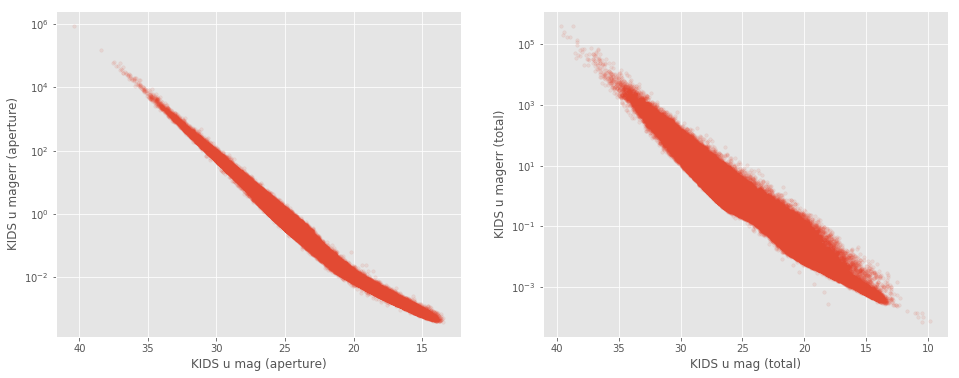

DECam g mag (aperture)
    Error max: 709507
    magerr > 10: Number of objects = 15784, min mag = 26.5
    magerr > 100: Number of objects = 1546, min mag = 28.9
    magerr > 1000: Number of objects = 167, min mag = 31.8

DECam g mag (total)
    Error max: 21677726
    magerr > 10: Number of objects = 15101, min mag = 5.1
    magerr > 100: Number of objects = 1533, min mag = 15.0
    magerr > 1000: Number of objects = 163, min mag = 15.0



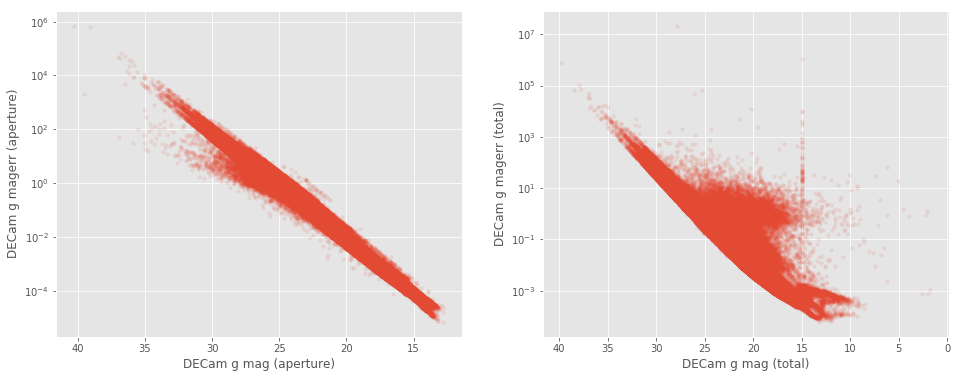

KIDS g mag (aperture)
    Error max: 97585
    magerr > 10: Number of objects = 12812, min mag = 28.1
    magerr > 100: Number of objects = 1206, min mag = 31.0
    magerr > 1000: Number of objects = 112, min mag = 33.7

KIDS g mag (total)
    Error max: 282136
    magerr > 10: Number of objects = 22328, min mag = 26.1
    magerr > 100: Number of objects = 2118, min mag = 28.7
    magerr > 1000: Number of objects = 232, min mag = 33.3



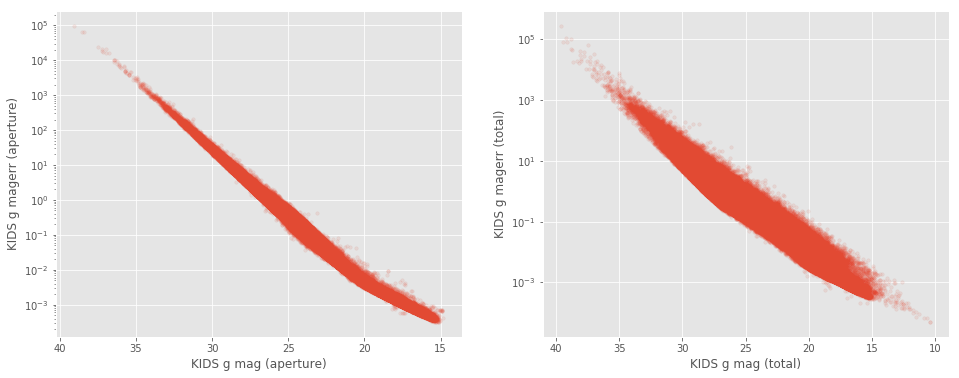

SUPRIME g mag (aperture)
    Error max: 2632623289532416
    magerr > 10: Number of objects = 65298, min mag = 28.6
    magerr > 100: Number of objects = 23090, min mag = 31.8
    magerr > 1000: Number of objects = 9886, min mag = 34.4

SUPRIME g mag (total)
    Error max: 119841105117184
    magerr > 10: Number of objects = 51113, min mag = 26.1
    magerr > 100: Number of objects = 13090, min mag = 30.2
    magerr > 1000: Number of objects = 5279, min mag = 33.5



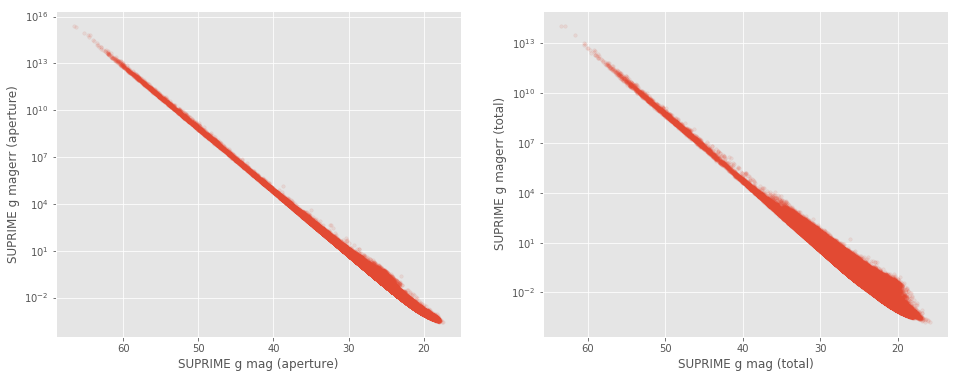

GPC1 g mag (aperture)
    Error max: 158856
    magerr > 10: Number of objects = 8199, min mag = 5.1
    magerr > 100: Number of objects = 803, min mag = 7.1
    magerr > 1000: Number of objects = 95, min mag = 29.0

GPC1 g mag (total)
    Error max: 50762
    magerr > 10: Number of objects = 7783, min mag = 5.2
    magerr > 100: Number of objects = 799, min mag = 8.4
    magerr > 1000: Number of objects = 90, min mag = 28.6



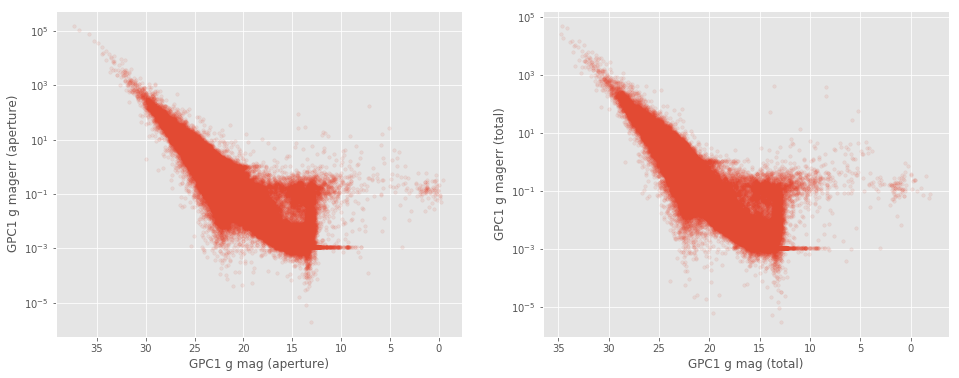

DECam r mag (aperture)
    Error max: 1182924
    magerr > 10: Number of objects = 10823, min mag = 25.3
    magerr > 100: Number of objects = 1050, min mag = 28.2
    magerr > 1000: Number of objects = 95, min mag = 31.7

DECam r mag (total)
    Error max: 6901391360
    magerr > 10: Number of objects = 7292, min mag = 9.9
    magerr > 100: Number of objects = 745, min mag = 14.6
    magerr > 1000: Number of objects = 71, min mag = 15.0



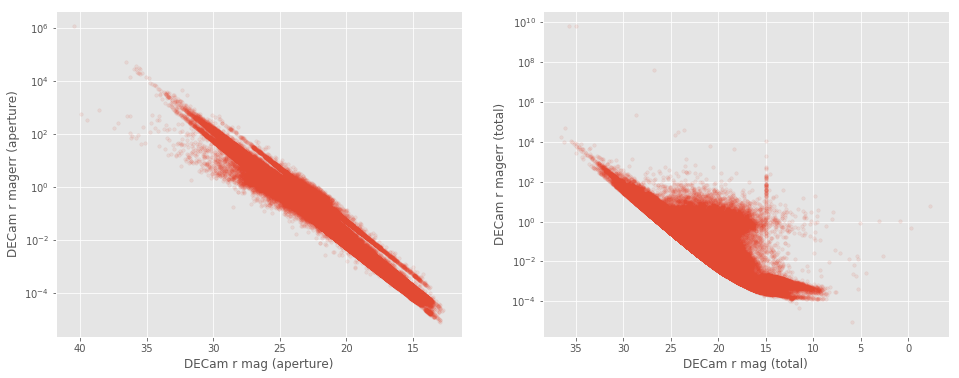

KIDS r mag (aperture)
    Error max: 19437
    magerr > 10: Number of objects = 3946, min mag = 28.4
    magerr > 100: Number of objects = 356, min mag = 31.1
    magerr > 1000: Number of objects = 35, min mag = 33.8

KIDS r mag (total)
    Error max: 1127289
    magerr > 10: Number of objects = 4165, min mag = 26.4
    magerr > 100: Number of objects = 415, min mag = 29.7
    magerr > 1000: Number of objects = 41, min mag = 33.4



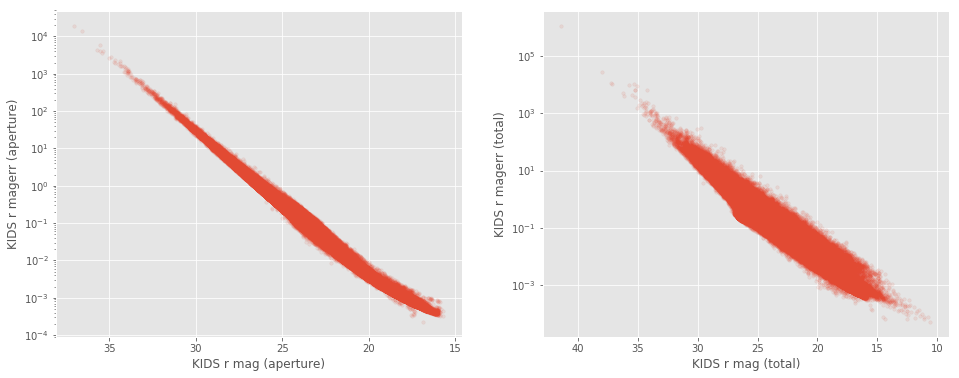

SUPRIME r mag (aperture)
    Error max: 235172746231808
    magerr > 10: Number of objects = 34049, min mag = 28.0
    magerr > 100: Number of objects = 10611, min mag = 31.7
    magerr > 1000: Number of objects = 4722, min mag = 34.3

SUPRIME r mag (total)
    Error max: 1865192439808
    magerr > 10: Number of objects = 33412, min mag = 22.7
    magerr > 100: Number of objects = 7209, min mag = 23.0
    magerr > 1000: Number of objects = 2675, min mag = 32.5



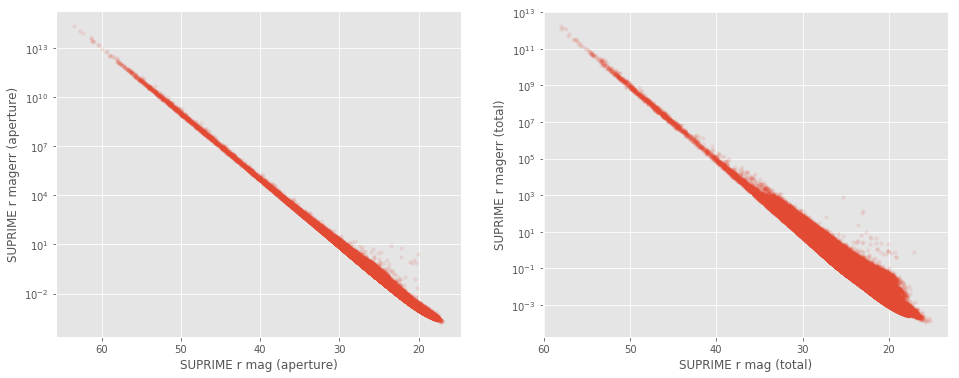

GPC1 r mag (aperture)
    Error max: 129143
    magerr > 10: Number of objects = 2671, min mag = 7.9
    magerr > 100: Number of objects = 268, min mag = 23.0
    magerr > 1000: Number of objects = 26, min mag = 28.3

GPC1 r mag (total)
    Error max: 131271
    magerr > 10: Number of objects = 3142, min mag = 7.9
    magerr > 100: Number of objects = 343, min mag = 22.7
    magerr > 1000: Number of objects = 41, min mag = 29.0



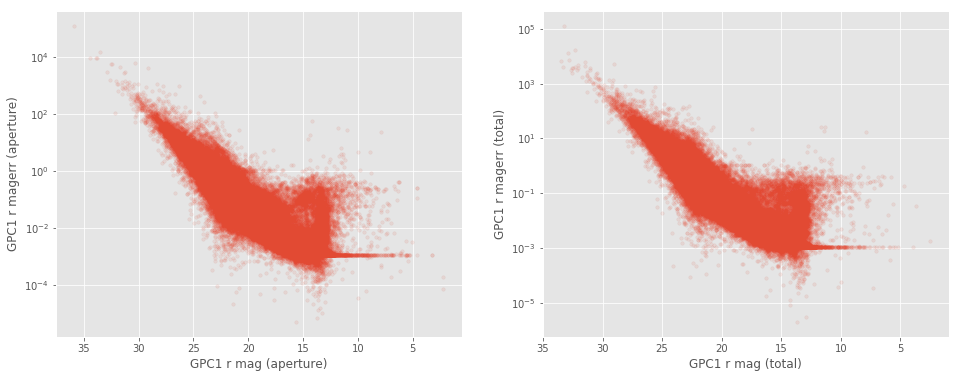

KIDS i mag (aperture)
    Error max: 204548
    magerr > 10: Number of objects = 22913, min mag = 26.4
    magerr > 100: Number of objects = 2084, min mag = 29.2
    magerr > 1000: Number of objects = 185, min mag = 31.8

KIDS i mag (total)
    Error max: 1720810
    magerr > 10: Number of objects = 40375, min mag = 24.6
    magerr > 100: Number of objects = 3962, min mag = 27.2
    magerr > 1000: Number of objects = 343, min mag = 31.4



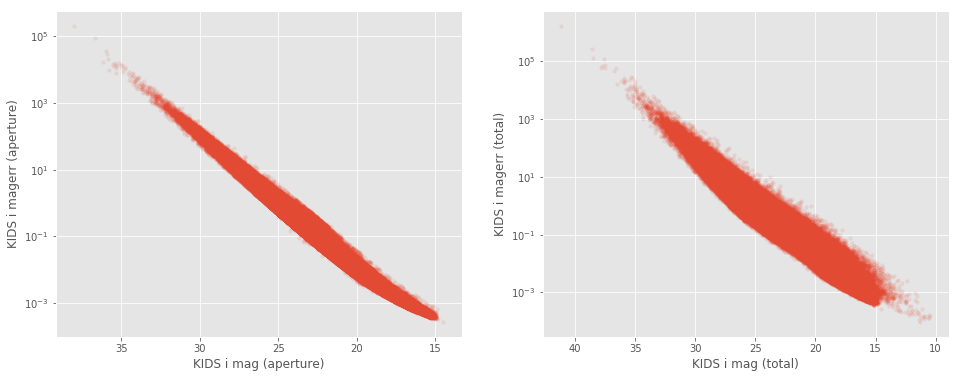

SUPRIME i mag (aperture)
    Error max: 3772047425536
    magerr > 10: Number of objects = 13447, min mag = 29.2
    magerr > 100: Number of objects = 5178, min mag = 32.0
    magerr > 1000: Number of objects = 2808, min mag = 34.1

SUPRIME i mag (total)
    Error max: 575083642880
    magerr > 10: Number of objects = 20835, min mag = 24.6
    magerr > 100: Number of objects = 4275, min mag = 30.0
    magerr > 1000: Number of objects = 1679, min mag = 32.9



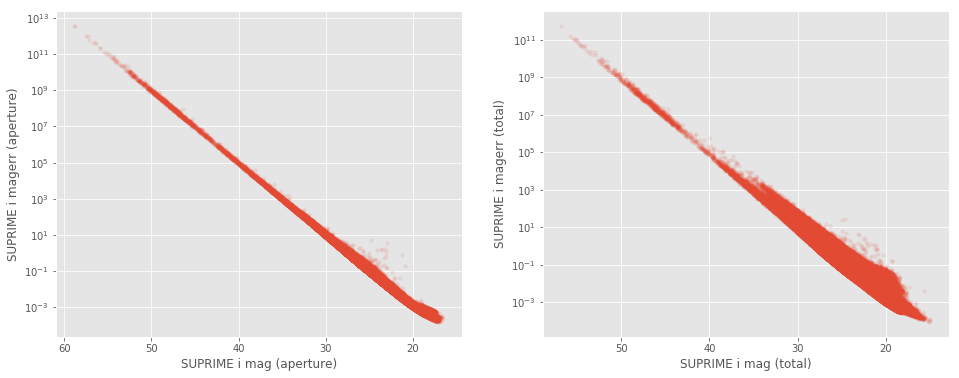

GPC1 i mag (aperture)
    Error max: 32691
    magerr > 10: Number of objects = 875, min mag = 22.3
    magerr > 100: Number of objects = 76, min mag = 23.3
    magerr > 1000: Number of objects = 9, min mag = 30.0

GPC1 i mag (total)
    Error max: 3786
    magerr > 10: Number of objects = 891, min mag = 11.8
    magerr > 100: Number of objects = 90, min mag = 25.1
    magerr > 1000: Number of objects = 4, min mag = 30.8



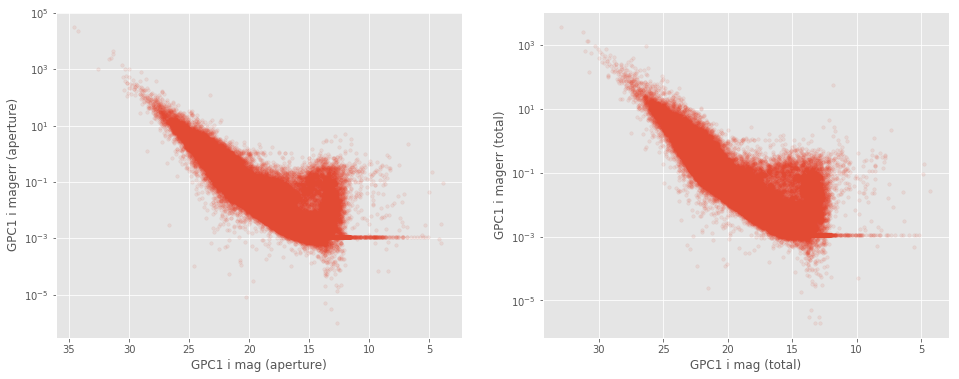

DECam z mag (aperture)
    Error max: 154156
    magerr > 10: Number of objects = 6523, min mag = 26.1
    magerr > 100: Number of objects = 585, min mag = 28.6
    magerr > 1000: Number of objects = 58, min mag = 31.7

DECam z mag (total)
    Error max: 3016
    magerr > 10: Number of objects = 628, min mag = 19.3
    magerr > 100: Number of objects = 64, min mag = 29.8
    magerr > 1000: Number of objects = 7, min mag = 32.6



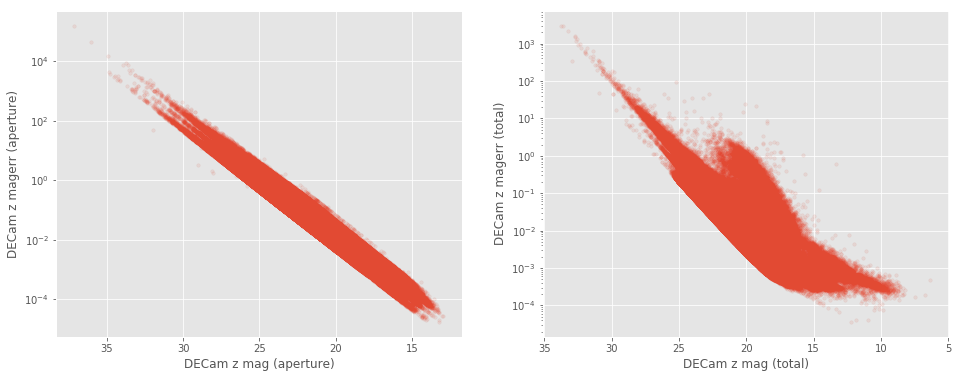

SUPRIME z mag (aperture)
    Error max: 83600842162176
    magerr > 10: Number of objects = 64947, min mag = 28.5
    magerr > 100: Number of objects = 20615, min mag = 31.1
    magerr > 1000: Number of objects = 8906, min mag = 33.3

SUPRIME z mag (total)
    Error max: 74743386472448
    magerr > 10: Number of objects = 51847, min mag = 25.9
    magerr > 100: Number of objects = 12484, min mag = 29.2
    magerr > 1000: Number of objects = 4979, min mag = 32.3



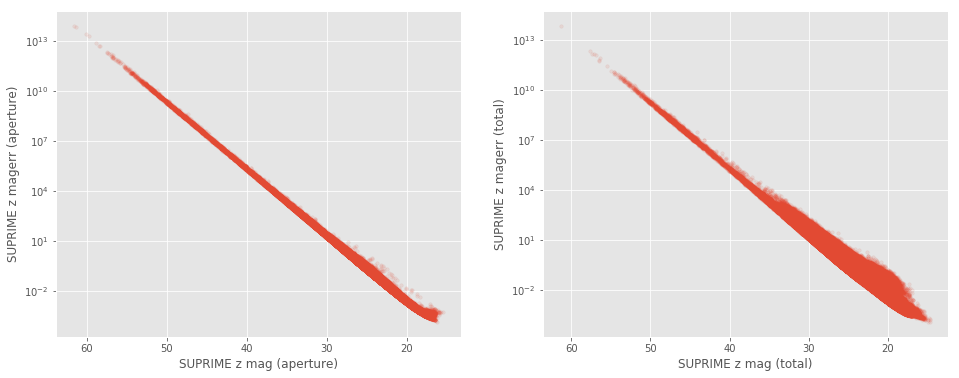

GPC1 z mag (aperture)
    Error max: 51286
    magerr > 10: Number of objects = 1607, min mag = 17.4
    magerr > 100: Number of objects = 156, min mag = 21.9
    magerr > 1000: Number of objects = 21, min mag = 28.1

GPC1 z mag (total)
    Error max: 33791
    magerr > 10: Number of objects = 1661, min mag = 18.1
    magerr > 100: Number of objects = 169, min mag = 23.3
    magerr > 1000: Number of objects = 17, min mag = 28.5



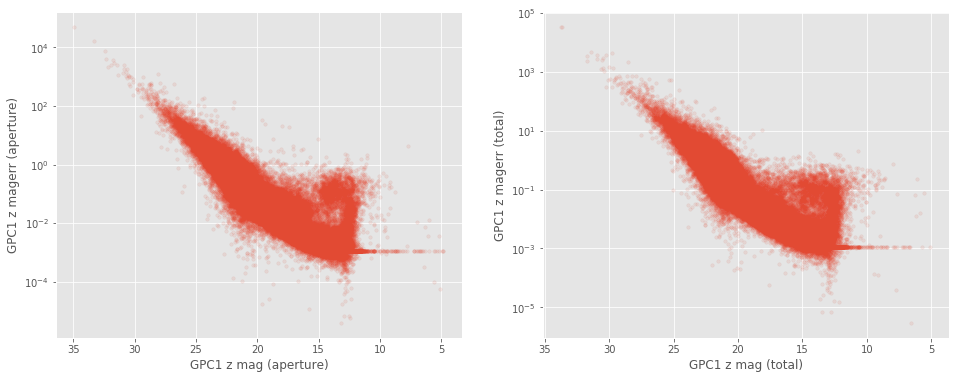

VIRCAM Z mag (aperture)
    Error max: 92
    magerr > 10: Number of objects = 33, min mag = 23.0
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

VIRCAM Z mag (total)
    Error max: 145422
    magerr > 10: Number of objects = 1410, min mag = 22.3
    magerr > 100: Number of objects = 132, min mag = 25.8
    magerr > 1000: Number of objects = 11, min mag = 30.1



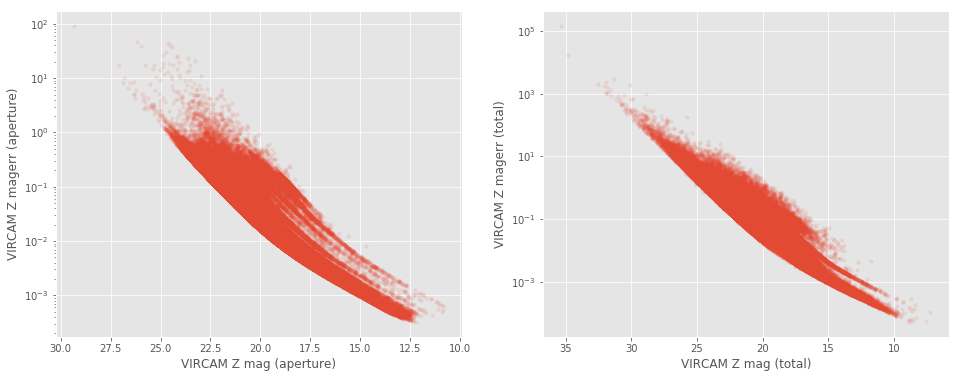

SUPRIME y mag (aperture)
    Error max: 2723471243083776
    magerr > 10: Number of objects = 153274, min mag = 26.0
    magerr > 100: Number of objects = 44892, min mag = 29.0
    magerr > 1000: Number of objects = 15046, min mag = 31.0

SUPRIME y mag (total)
    Error max: 24346361856000
    magerr > 10: Number of objects = 102186, min mag = 24.6
    magerr > 100: Number of objects = 22641, min mag = 28.4
    magerr > 1000: Number of objects = 7544, min mag = 31.2



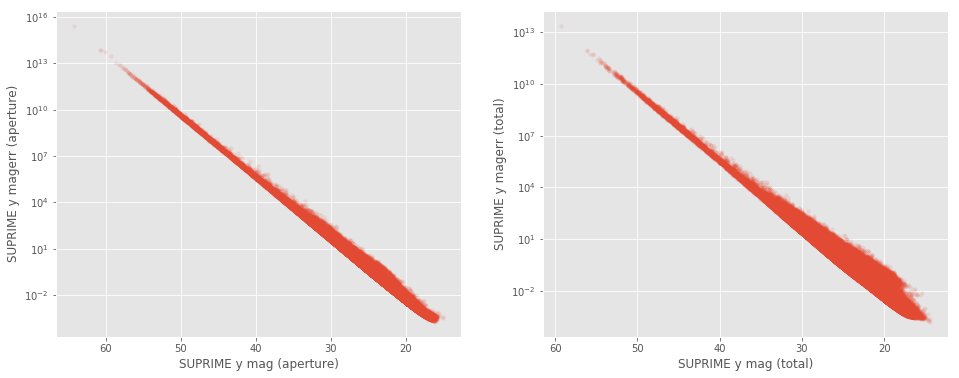

GPC1 y mag (aperture)
    Error max: 462215
    magerr > 10: Number of objects = 3426, min mag = 19.7
    magerr > 100: Number of objects = 336, min mag = 20.9
    magerr > 1000: Number of objects = 36, min mag = 20.9

GPC1 y mag (total)
    Error max: 22286
    magerr > 10: Number of objects = 5451, min mag = 19.5
    magerr > 100: Number of objects = 527, min mag = 23.1
    magerr > 1000: Number of objects = 43, min mag = 27.1



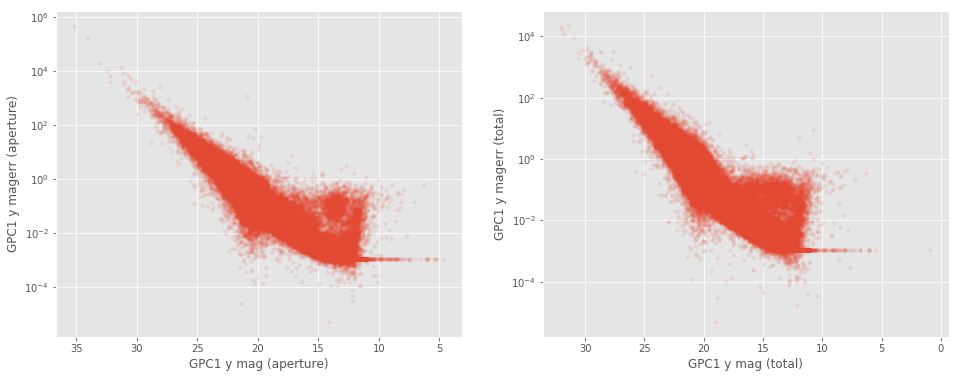

VIRCAM Y mag (aperture)
    Error max: 102
    magerr > 10: Number of objects = 13, min mag = 23.1
    magerr > 100: Number of objects = 1, min mag = 25.1
    magerr > 1000: Number of objects = 0, min mag = nan

VIRCAM Y mag (total)
    Error max: 10161
    magerr > 10: Number of objects = 761, min mag = 22.2
    magerr > 100: Number of objects = 86, min mag = 26.6
    magerr > 1000: Number of objects = 10, min mag = 29.1



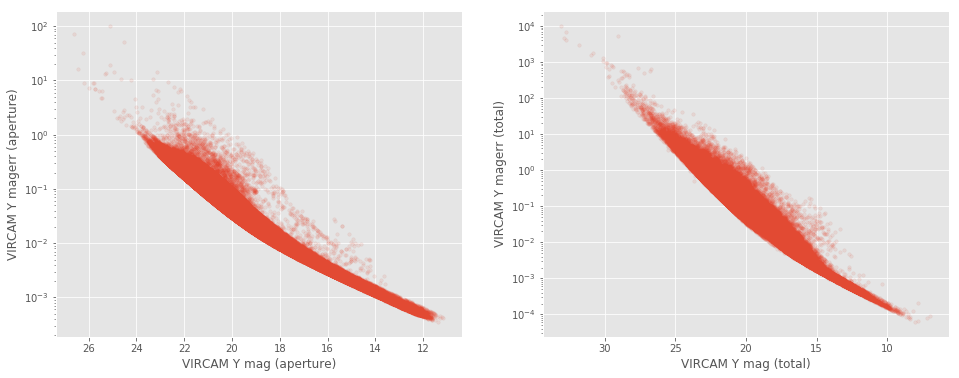

UKIDSS Y mag (aperture)
    Error max: 152
    magerr > 10: Number of objects = 21, min mag = 23.9
    magerr > 100: Number of objects = 2, min mag = 28.4
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS Y mag (total)
    Error max: 45902
    magerr > 10: Number of objects = 3033, min mag = 24.1
    magerr > 100: Number of objects = 302, min mag = 26.8
    magerr > 1000: Number of objects = 22, min mag = 29.9



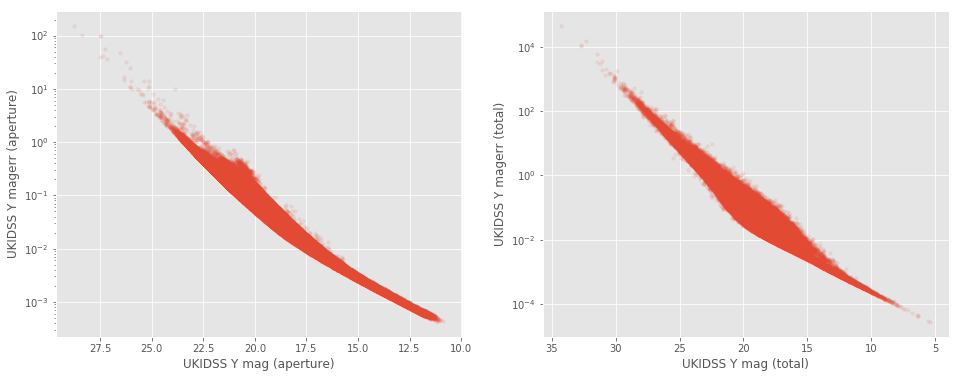

UKIDSS J mag (aperture)
    Error max: 172
    magerr > 10: Number of objects = 15, min mag = 24.7
    magerr > 100: Number of objects = 1, min mag = 27.5
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS J mag (total)
    Error max: 903
    magerr > 10: Number of objects = 28, min mag = 24.3
    magerr > 100: Number of objects = 4, min mag = 26.9
    magerr > 1000: Number of objects = 0, min mag = nan



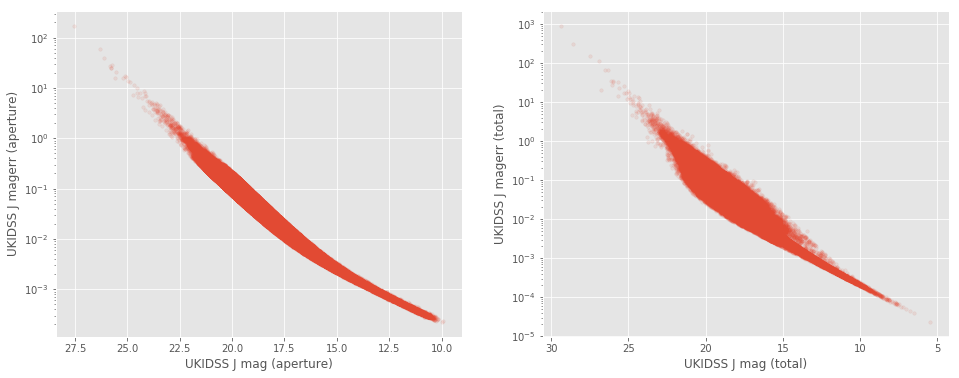

VIRCAM J mag (aperture)
    Error max: 426
    magerr > 10: Number of objects = 9, min mag = 22.7
    magerr > 100: Number of objects = 1, min mag = 29.5
    magerr > 1000: Number of objects = 0, min mag = nan

VIRCAM J mag (total)
    Error max: 1501
    magerr > 10: Number of objects = 685, min mag = 21.8
    magerr > 100: Number of objects = 38, min mag = 27.2
    magerr > 1000: Number of objects = 2, min mag = 31.0



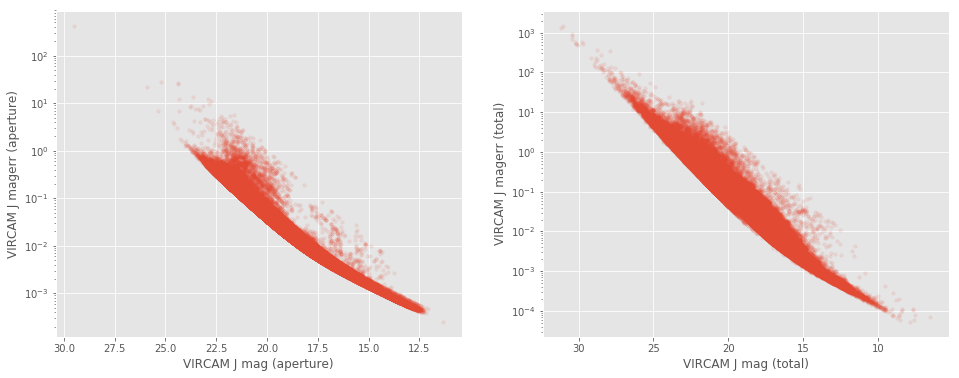

UKIDSS H mag (aperture)
    Error max: 242
    magerr > 10: Number of objects = 4, min mag = 24.4
    magerr > 100: Number of objects = 1, min mag = 27.7
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS H mag (total)
    Error max: 4304
    magerr > 10: Number of objects = 202, min mag = 23.3
    magerr > 100: Number of objects = 14, min mag = 25.7
    magerr > 1000: Number of objects = 3, min mag = 29.1



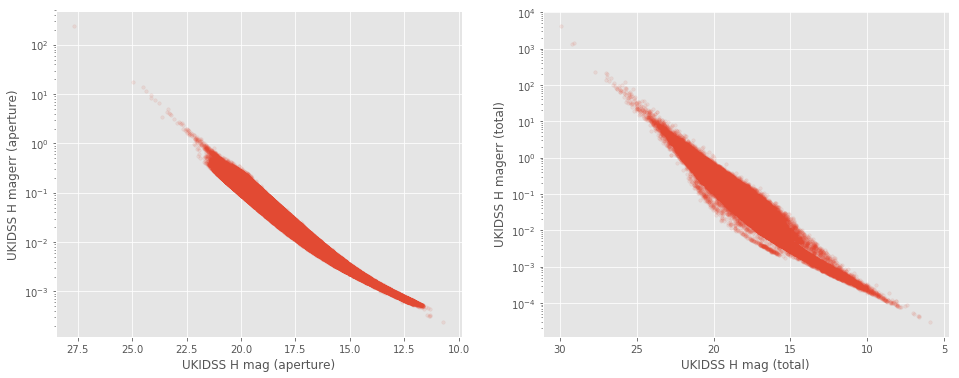

VIRCAM H mag (aperture)
    Error max: 2245
    magerr > 10: Number of objects = 373, min mag = 20.4
    magerr > 100: Number of objects = 34, min mag = 25.4
    magerr > 1000: Number of objects = 1, min mag = 30.7

VIRCAM H mag (total)
    Error max: 87641
    magerr > 10: Number of objects = 2103, min mag = 19.7
    magerr > 100: Number of objects = 175, min mag = 25.8
    magerr > 1000: Number of objects = 16, min mag = 28.5



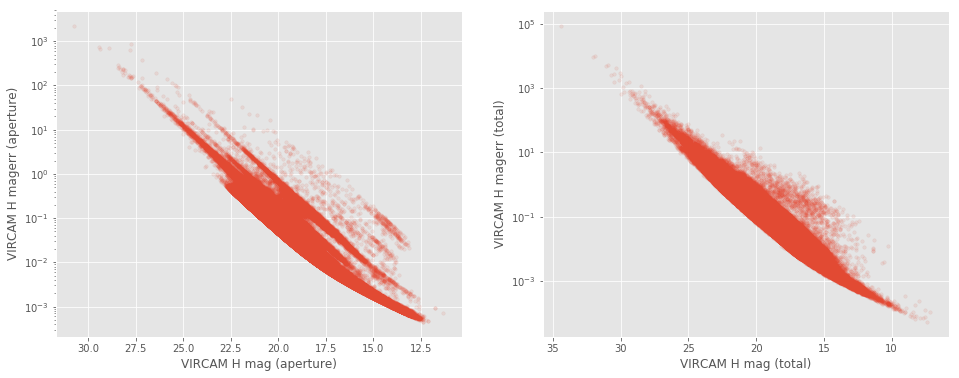

UKIDSS K mag (aperture)
    Error max: 214
    magerr > 10: Number of objects = 3, min mag = 24.7
    magerr > 100: Number of objects = 1, min mag = 27.5
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS K mag (total)
    Error max: 14870
    magerr > 10: Number of objects = 224, min mag = 23.1
    magerr > 100: Number of objects = 25, min mag = 25.8
    magerr > 1000: Number of objects = 2, min mag = 29.1



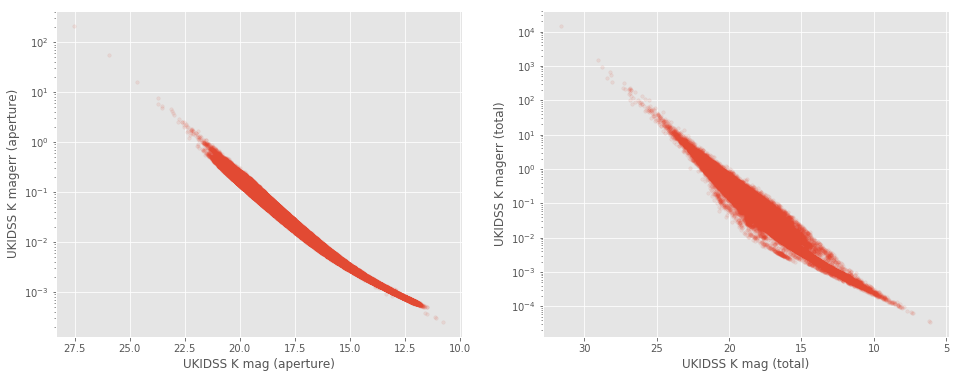

VIRCAM K mag (aperture)
    Error max: 42
    magerr > 10: Number of objects = 3, min mag = 23.8
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

VIRCAM K mag (total)
    Error max: 21180
    magerr > 10: Number of objects = 400, min mag = 21.4
    magerr > 100: Number of objects = 24, min mag = 24.8
    magerr > 1000: Number of objects = 1, min mag = 33.2



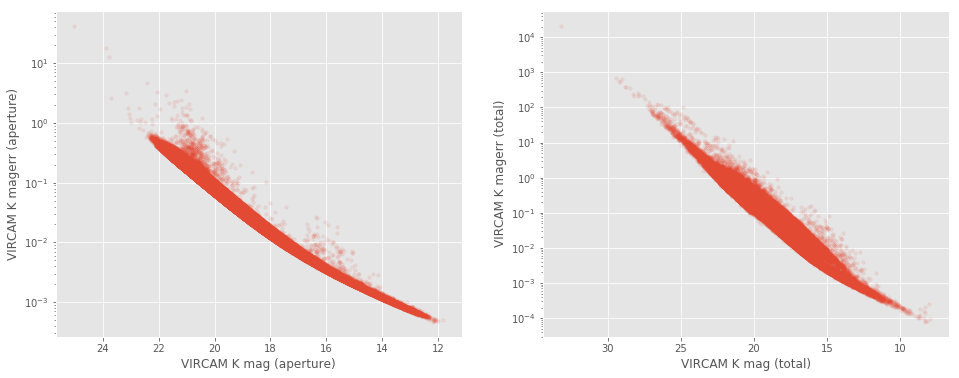

In [7]:
for mag in all_mags:
    
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
        
    basecol = mag.replace(" ", "_").lower()
    
    if basecol == "kids_g" or basecol == "suprime_g":
        savefig = True
    else:
        savefig=False
        
    col, ecol = "m_ap_{}".format(basecol), "merr_ap_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax1,
               labels=("{} mag (aperture)".format(mag), "{} magerr (aperture)".format(mag)), savefig=False)

    
    col, ecol = "m_{}".format(basecol), "merr_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax2,
               labels=("{} mag (total)".format(mag), "{} magerr (total)".format(mag)), savefig=savefig)
    
    display(fig)
    plt.close()


## 2. Magnitude and error issues

In [9]:
def flag_mag(mask, x1, y1, x2, y2, mask2=None, x3=None, y3=None,  
             labels1=("x", "y"), labels2=("x", "y"), labels3=("x", "y"), nb=2,
             savefig=False):

    if nb == 2:
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
    else:
        fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 6))
    
    # mag vs magerr
    ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax1.scatter(x1, y1, marker='.', alpha=0.1, s=50)
    ax1.plot(x1[mask], y1[mask], 'b.')
    if mask2 is not None:
        ax1.plot(x1[mask2], y1[mask2], 'g.')
    ax1.invert_xaxis()
    ax1.set_xlabel(labels1[0])
    ax1.set_ylabel(labels1[1])
    
    # Comparing magnitudes
    ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
    ax2.plot(x2[mask], y2[mask], 'b.')
    if mask2 is not None:
        ax2.plot(x2[mask2], y2[mask2], 'g.')
    ax2.invert_xaxis()
    ax2.invert_yaxis()
    ax2.set_xlabel(labels2[0])
    ax2.set_ylabel(labels2[1])
    
    if nb >= 3:
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask], y3[mask], 'b.')
        if mask2 is not None:
            ax3.plot(x3[mask2], y3[mask2], 'g.')
        ax3.invert_xaxis()
        ax3.invert_yaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Save ex. fig
    if savefig:
        survey_label = ((labels1[0].replace(" ", "_")).replace("(", "")).replace(")", "")
        if "GPC1 " in labels1[0]:
            figname = field + "_gpc1Issues_" + survey_label + ".png"
        elif "DECam" in labels1[0]:
            figname = field + "_decamIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')
        
    display(fig)
    plt.close()


### 2.a Pan-STARRS Aperture and Total magnitudes

GPC1 g
   Number of flagged objects: 679


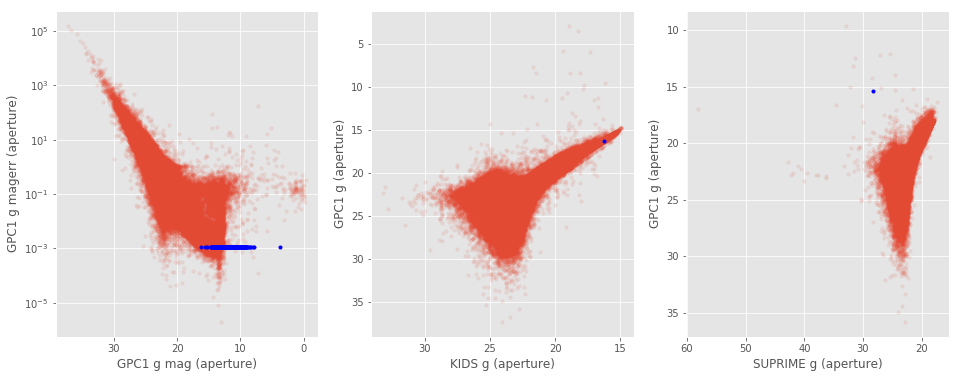

GPC1 r
   Number of flagged objects: 973


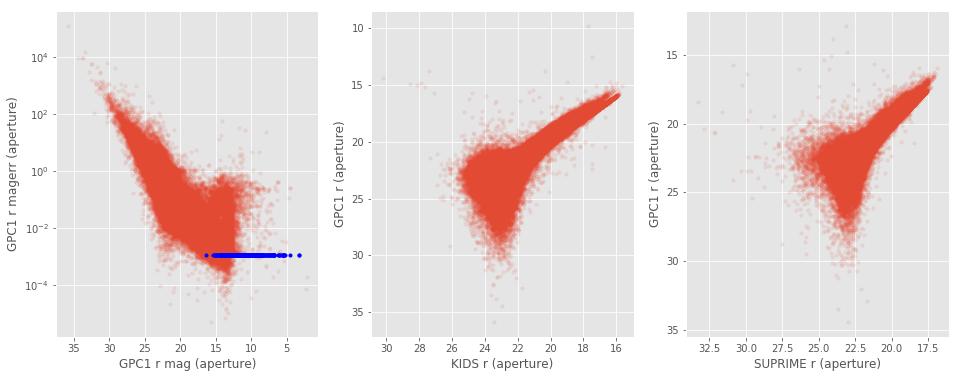

GPC1 i
   Number of flagged objects: 1398


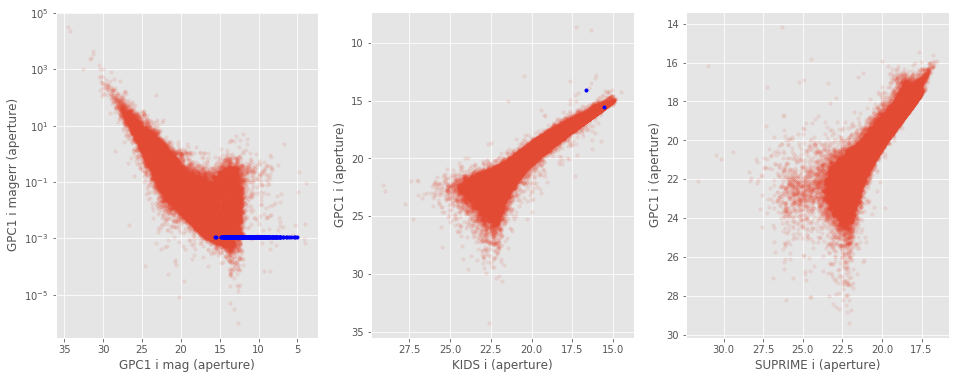

GPC1 z
   Number of flagged objects: 758


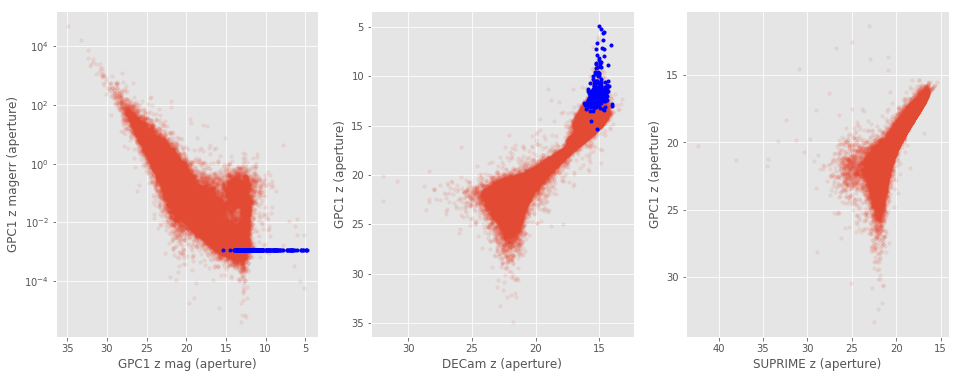

GPC1 y
   Number of flagged objects: 371


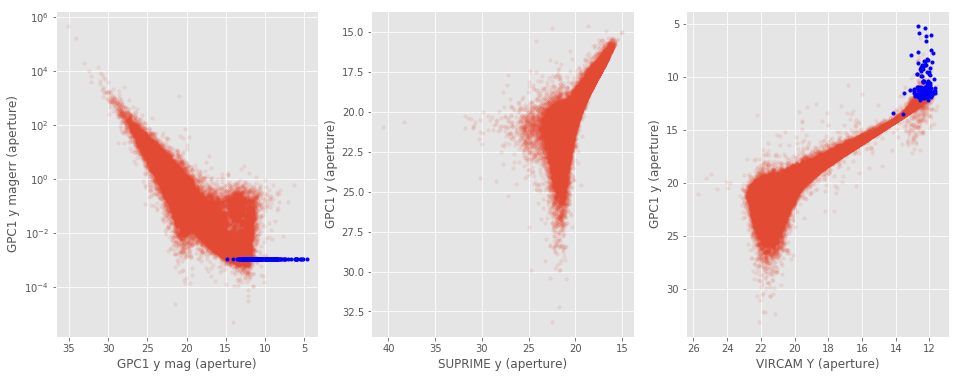

In [16]:
ps1_err = 0.0010860000038519502
bands = ['g', 'r', 'i', 'z', 'y']

for i, surveys in enumerate([g_bands, r_bands, i_bands, z_bands, y_bands]):
    surveys.insert(0, surveys.pop(surveys.index('GPC1 '+ bands[i])))
    print(surveys[0])
    
    basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
    col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
    ecol1 = "merr_ap_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_ap_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (aperture)".format(surveys[2]), "{} (aperture)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'gpc1_z':
        savefig = True
    else:
        savefig = False

        
    mask = np.where(master_catalogue[ecol1] == ps1_err)
    print ('   Number of flagged objects:', len(master_catalogue[ecol1][mask]))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                    master_catalogue[col2], master_catalogue[col1], 
                    x3=x3, y3=y3,
                    labels1=("{} mag (aperture)".format(surveys[0]), "{} magerr (aperture)".format(surveys[0])),
                    labels2=("{} (aperture)".format(surveys[1]), "{} (aperture)".format(surveys[0])),
                    labels3=labels3, nb=len(surveys), savefig=savefig)

### 2.b. DECaLS total magnitudes

DECam g
   Number of flagged objects (m=14.999935): 89
   Number of flagged objects (m < 7 (and m=0)): 14 (0)


/data/vault/epons/conda_envs/herschelhelp_internal/lib/python3.6/site-packages/astropy/table/column.py:929: RuntimeWarning: invalid value encountered in less
  return getattr(self.data, oper)(other)


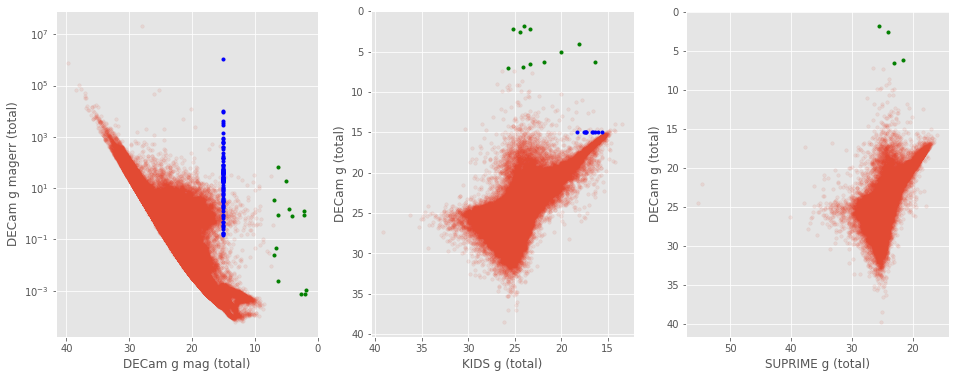

DECam r
   Number of flagged objects (m=14.999935): 85
   Number of flagged objects (m < 7 (and m=0)): 15 (2)


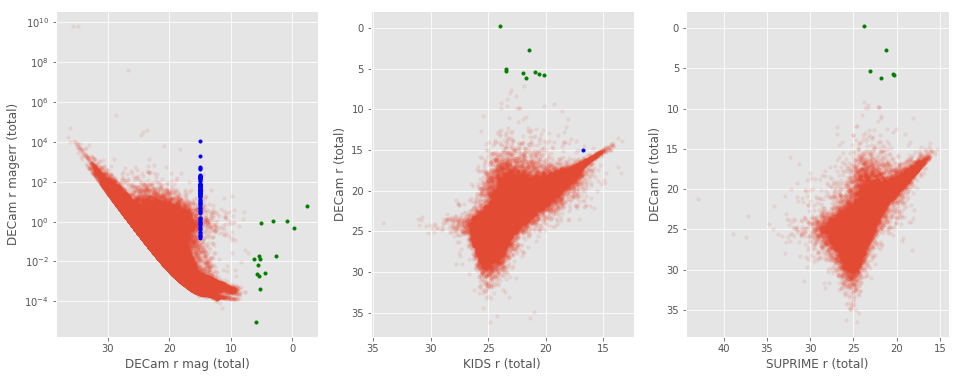

DECam z
   Number of flagged objects (m=14.999935): 0
   Number of flagged objects (m < 7 (and m=0)): 2 (0)


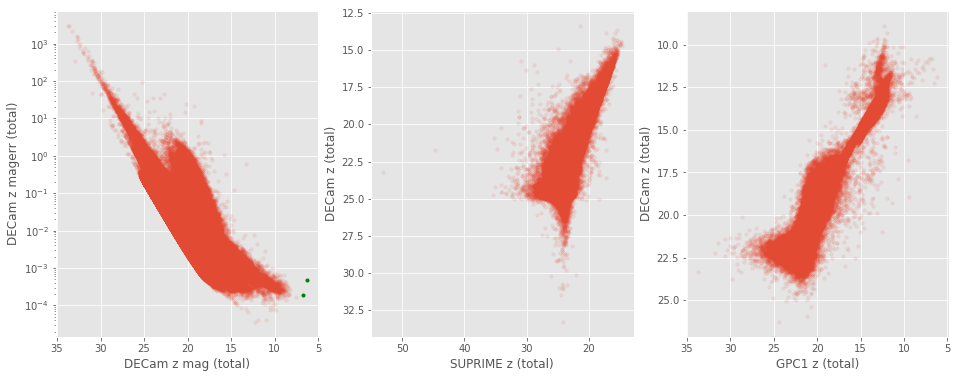

In [11]:
bands = ['g', 'r', 'z']

for i, surveys in enumerate([g_bands, r_bands, z_bands]):
    surveys.insert(0, surveys.pop(surveys.index('DECam '+ bands[i])))
    print(surveys[0])
    
    basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
    col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
    ecol1 = "merr_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (total)".format(surveys[2]), "{} (total)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'decam_g':
        savefig = True
    else:
        savefig = False

    def cstr(s, color=34):
        # ANSI color: red: color=31, blue: color=34, green:color=32
        return "\x1b[{}m{}\x1b[0m".format(color, s)


    mask = (master_catalogue[col1] == 14.999935)
    print ('   Number of flagged objects ({}): {}'.format(cstr('m=14.999935'), len(master_catalogue[ecol1][mask])))
    mask2 = (master_catalogue[col1] < 7)
    mag0 = (master_catalogue[col1] < 0)
    print('   Number of flagged objects ({}): {} ({})'.format(cstr('m < 7 (and m=0)', color=32),\
                                                                           len(master_catalogue[ecol1][mask2]),\
                                                                           len(master_catalogue[ecol1][mag0])))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                   master_catalogue[col2], master_catalogue[col1], 
                   x3=x3, y3=y3, mask2=mask2, 
                   labels1=("{} mag (total)".format(surveys[0]), "{} magerr (total)".format(surveys[0])),
                   labels2=("{} (total)".format(surveys[1]), "{} (total)".format(surveys[0])),
                   labels3=labels3, nb=len(surveys), savefig=savefig)

## 3/ Outliers

$$chi^2 = \frac{(mag_{1}-mag_{2})^2}{magerr_{1}^2 + magerr_{2}^2}$$ 
<br>
__Interquartile range (IQR) and outliers:__<br>
We consider as outliers objects which have a high $chi^2$, about $5\sigma$ away from the mean.<br>
$25th, 75th \;percentile = 0.6745\sigma$<br>
$IQR = (75th \;percentile - 25th \;percentile) = 0.6745\sigma * 2 = 1.349\sigma$<br>
$75th \;percentile + 3.2\times IQR = 0.6745\sigma + 3.2\times1.349\sigma = 5\sigma$
<br><br>
$$outliers == [chi^2 >  (75th \;percentile + 3.2\times (75th \;percentile - 25th \;percentile))]$$
<br><br>
__NB:__<br>
Bright sources tend to have their errors underestimated with values as low as $10^{-6}$, which is unrealistic. So to avoid high $chi^2$ due to unrealistic small errors, we clip the error to get a minimum value of 0.1% (i.e. all errors smaller then $10^{-3}$ are set to $10^{-3}$).

In [12]:
def outliers(x, y, xerr, yerr, labels=["x", "y"], savefig=False):
    
    import matplotlib
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(xerr) & np.isfinite(yerr)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    xerr = np.copy(xerr[mask])
    yerr = np.copy(yerr[mask])
    
    # mag1 - mag2
    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    # Set the minimum error to 10^-3
    np.clip(xerr, 1e-3, np.max(xerr), out=xerr)
    np.clip(yerr, 1e-3, np.max(yerr), out=yerr)

    # Median, Median absolute deviation and 1% and 99% percentiles
    diff_median = np.median(diff)
    diff_mad = np.median(np.abs(diff - diff_median))
    diff_1p, diff_99p = np.percentile(diff, [1., 99.])
    diff_25p, diff_75p = np.percentile(diff, [25., 75.])
    
    
    diff_label = "{} - {}".format(y_label, x_label)

    print("{} ({} sources):".format(diff_label, len(x)))
    print("- Median: {:.2f}".format(diff_median))
    print("- Median Absolute Deviation: {:.2f}".format(diff_mad))
    print("- 1% percentile: {}".format(diff_1p))
    print("- 99% percentile: {}".format(diff_99p))

    
    # Chi2 (Normalized difference)   
    ichi2 = np.power(diff, 2) / (np.power(xerr, 2) + np.power(yerr, 2))
    
    # Use only non-null values of ichi2
    mask2 = ichi2 != 0.0
    diff, ichi2 = np.copy(diff[mask2]), np.copy(ichi2[mask2])
    x, y, xerr, yerr = np.copy(x[mask2]), np.copy(y[mask2]), np.copy(xerr[mask2]), np.copy(yerr[mask2])

    # Outliers (5sigma)
    log_ichi2_25p, log_ichi2_75p = np.percentile(np.log10(ichi2), [25., 75.])
    out_lim = log_ichi2_75p + 3.2*abs(log_ichi2_25p-log_ichi2_75p)
    
    outliers = np.log10(ichi2) > out_lim 
    nb_outliers = len(x[outliers])
    
    print("Outliers separation: log(chi2) = {:.2f}".format(out_lim))
    print("Number of outliers: {}".format(nb_outliers))

    print("")

    # Comparing mag
    ax1.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax1.scatter(x[outliers], y[outliers], marker='.', c='b', alpha=0.3, s=50, label='Outliers ({})'.format(nb_outliers))
    min_val = np.min(np.r_[x, y])
    max_val = np.max(np.r_[x, y])
    ax1.autoscale(False)
    ax1.plot([min_val, max_val], [min_val, max_val], "k:")
    ax1.invert_xaxis()
    ax1.invert_yaxis()
    ax1.set_xlabel(x_label)
    ax1.set_ylabel(y_label)
    ax1.legend(loc='lower right', numpoints=1)
    

    # Chi2 vs Diff
    #ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax2.scatter(diff, np.log10(ichi2), marker='.', alpha=0.1, s=50)
    if nb_outliers != 0:
        ax2.scatter(diff[outliers], np.log10(ichi2[outliers]), marker='.', alpha=0.3, s=50, color='b',\
                    label='Outliers ({})'.format(nb_outliers))
    ax2.axhline(out_lim, color='grey', linestyle=':')
    ax2.set_xlabel(diff_label)
    ax2.set_ylabel('log(chi2)')
    ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(np.log10(ichi2), ax=ax3, bins='knuth', facecolor='red', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    if nb_outliers > 3:
        n, bins, patches = vz.hist(np.log10(ichi2[outliers]), ax=ax3, bins='knuth', facecolor='b', lw = 2, alpha=0.7,\
                                   orientation="horizontal")
    ax3.axhline(out_lim, color='grey', linestyle=':')
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_outliers_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

KIDS g (aperture) - DECam g (aperture) (1148344 sources):
- Median: 0.18
- Median Absolute Deviation: 0.28
- 1% percentile: -2.634096145629883
- 99% percentile: 1.73380958557129
Outliers separation: log(chi2) = 5.62
Number of outliers: 106



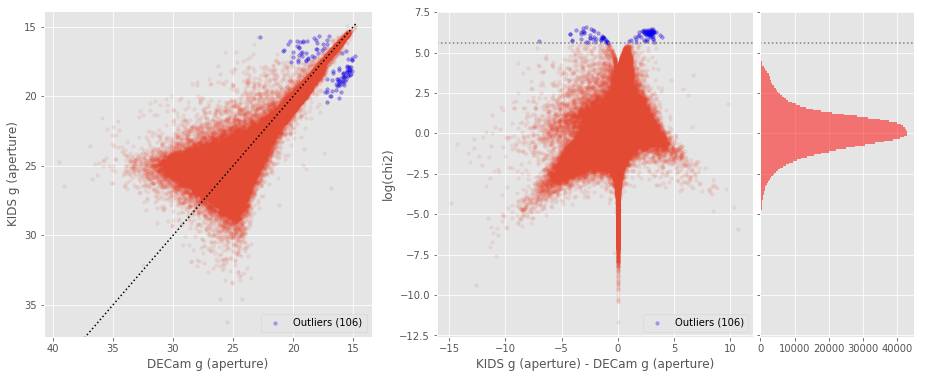

KIDS g (total) - DECam g (total) (1157882 sources):
- Median: 0.09
- Median Absolute Deviation: 0.24
- 1% percentile: -2.4240271186828615
- 99% percentile: 2.0510866737365694
Outliers separation: log(chi2) = 4.84
Number of outliers: 137



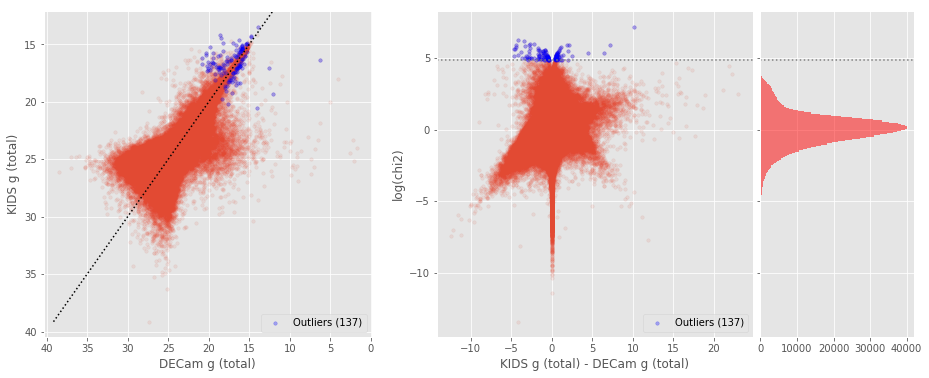

SUPRIME g (aperture) - DECam g (aperture) (511050 sources):
- Median: 0.11
- Median Absolute Deviation: 0.31
- 1% percentile: -2.922472896575928
- 99% percentile: 2.2731615829467797
Outliers separation: log(chi2) = 5.57
Number of outliers: 26



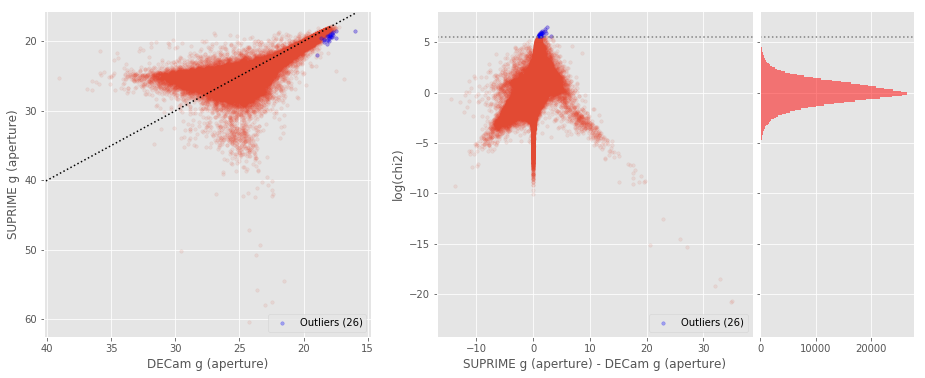

SUPRIME g (total) - DECam g (total) (510284 sources):
- Median: -0.14
- Median Absolute Deviation: 0.26
- 1% percentile: -3.1349516105651856
- 99% percentile: 1.9637036705017081
Outliers separation: log(chi2) = 4.48
Number of outliers: 254



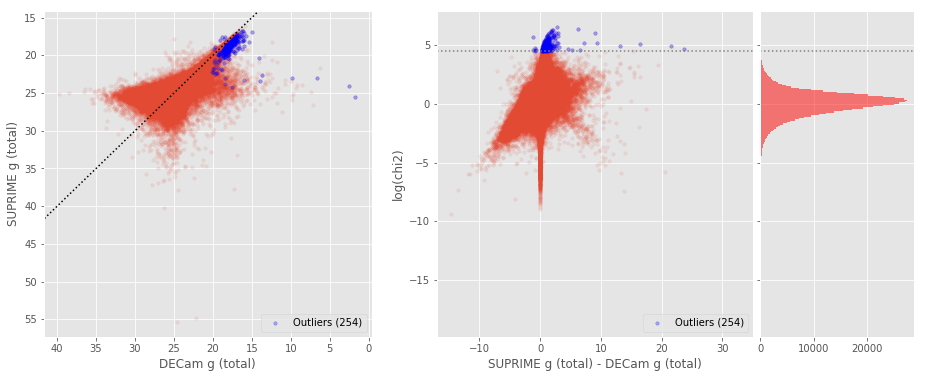

GPC1 g (aperture) - DECam g (aperture) (406433 sources):
- Median: -0.11
- Median Absolute Deviation: 0.30
- 1% percentile: -3.582785797119141
- 99% percentile: 2.3899072265624985
Outliers separation: log(chi2) = 5.23
Number of outliers: 1102



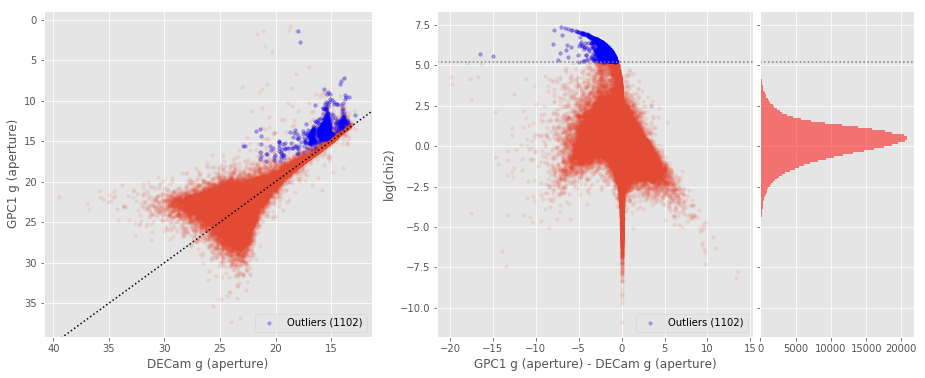

GPC1 g (total) - DECam g (total) (414060 sources):
- Median: -0.00
- Median Absolute Deviation: 0.25
- 1% percentile: -3.7355956268310546
- 99% percentile: 1.9217100906371878
Outliers separation: log(chi2) = 5.12
Number of outliers: 97



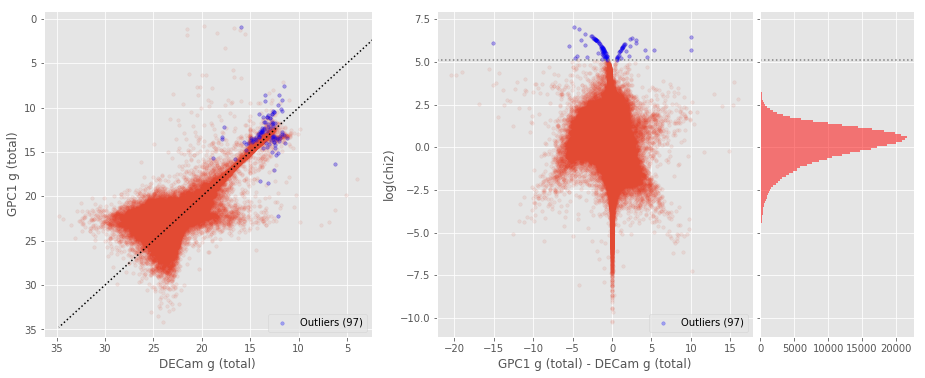

SUPRIME g (aperture) - KIDS g (aperture) (1747500 sources):
- Median: -0.10
- Median Absolute Deviation: 0.15
- 1% percentile: -1.639749526977539
- 99% percentile: 0.9492234992980966
Outliers separation: log(chi2) = 4.09
Number of outliers: 253



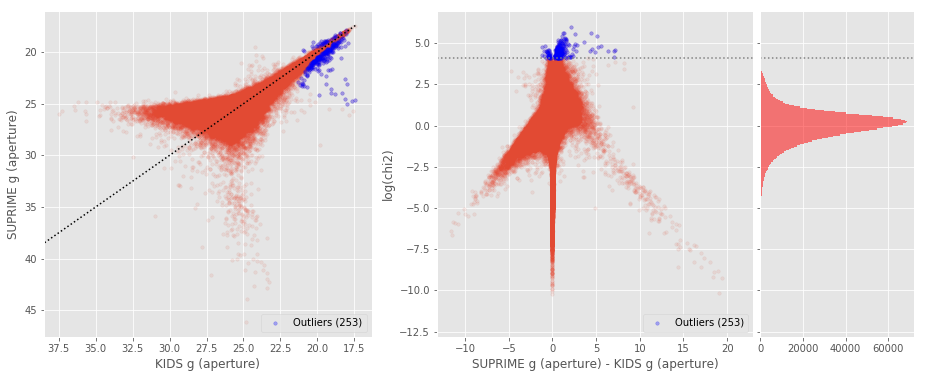

SUPRIME g (total) - KIDS g (total) (1727889 sources):
- Median: -0.28
- Median Absolute Deviation: 0.25
- 1% percentile: -2.5640608215332032
- 99% percentile: 1.1282776641845618
Outliers separation: log(chi2) = 4.07
Number of outliers: 1104



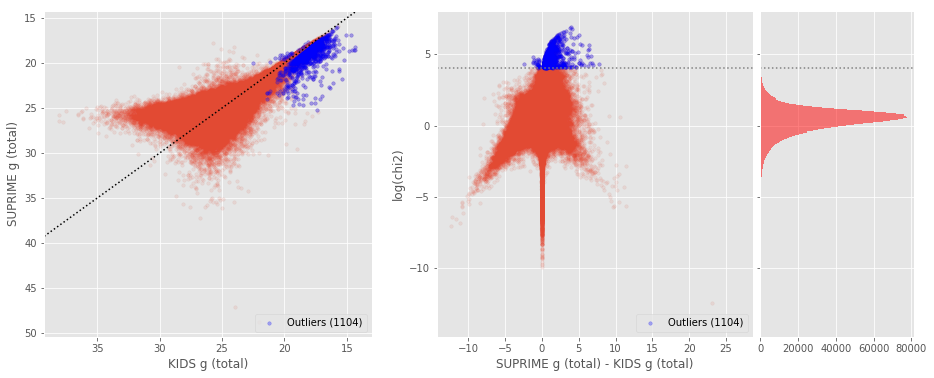

GPC1 g (aperture) - KIDS g (aperture) (1204894 sources):
- Median: -0.31
- Median Absolute Deviation: 0.38
- 1% percentile: -3.1371237373352048
- 99% percentile: 2.213497180938726
Outliers separation: log(chi2) = 6.87
Number of outliers: 0



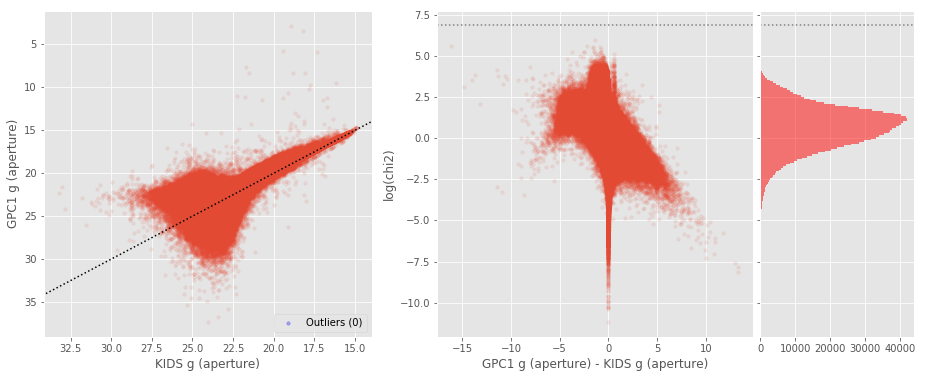

GPC1 g (total) - KIDS g (total) (1221860 sources):
- Median: -0.12
- Median Absolute Deviation: 0.25
- 1% percentile: -3.543268051147461
- 99% percentile: 1.5813409042358293
Outliers separation: log(chi2) = 5.60
Number of outliers: 5



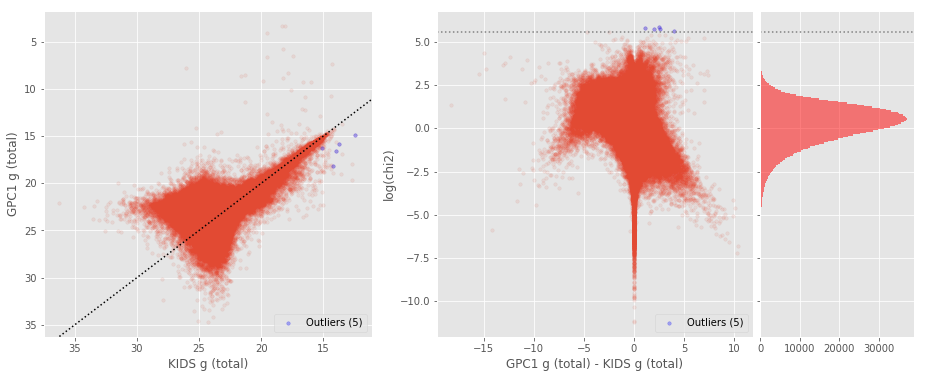

GPC1 g (aperture) - SUPRIME g (aperture) (330056 sources):
- Median: -0.28
- Median Absolute Deviation: 0.43
- 1% percentile: -3.1680870056152344
- 99% percentile: 2.4179883003234885
Outliers separation: log(chi2) = 6.44
Number of outliers: 0



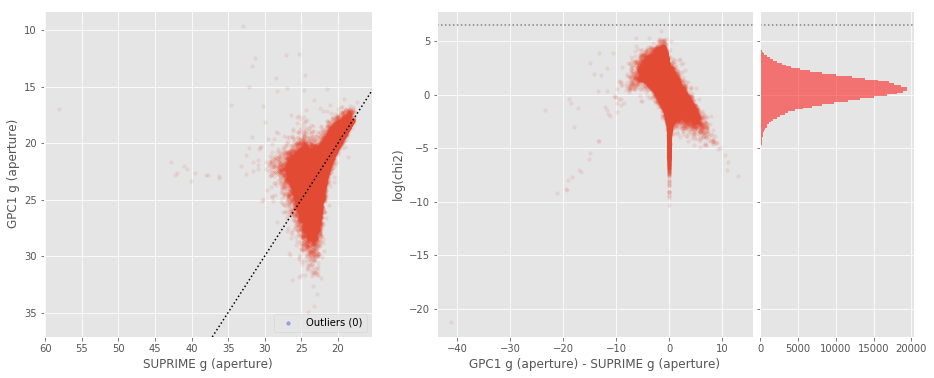

GPC1 g (total) - SUPRIME g (total) (334448 sources):
- Median: -0.04
- Median Absolute Deviation: 0.30
- 1% percentile: -3.2857796096801755
- 99% percentile: 1.758656272888181
Outliers separation: log(chi2) = 5.22
Number of outliers: 5



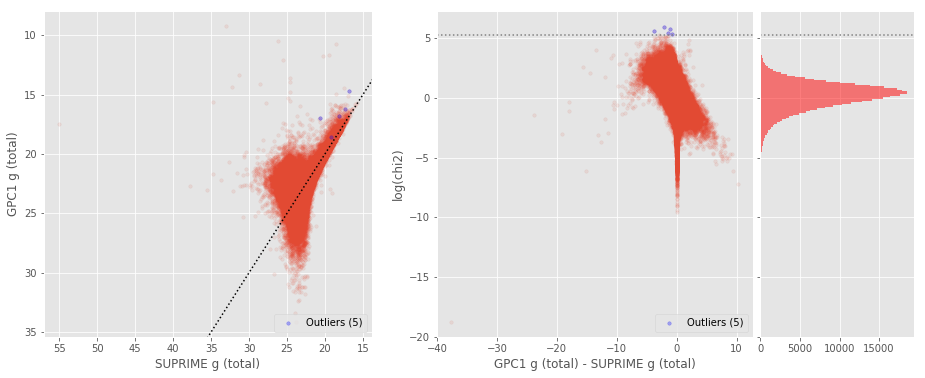

KIDS r (aperture) - DECam r (aperture) (1478644 sources):
- Median: 0.20
- Median Absolute Deviation: 0.23
- 1% percentile: -2.137364654541016
- 99% percentile: 1.1862708282470713
Outliers separation: log(chi2) = 6.48
Number of outliers: 1



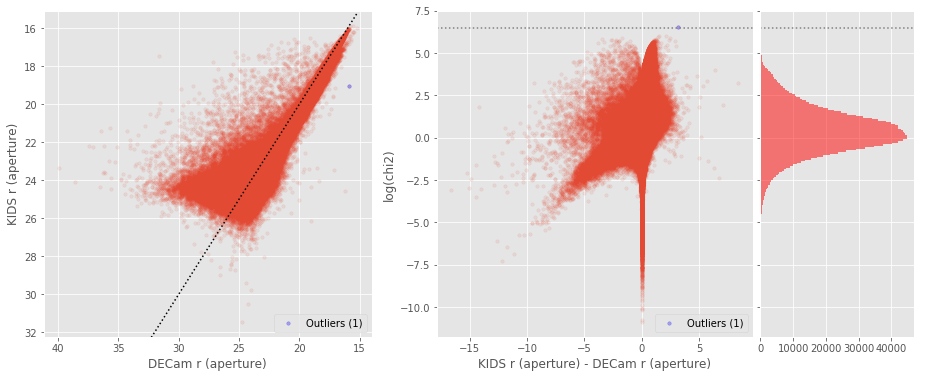

KIDS r (total) - DECam r (total) (1502798 sources):
- Median: 0.17
- Median Absolute Deviation: 0.16
- 1% percentile: -1.1469199562072752
- 99% percentile: 1.4274457168579113
Outliers separation: log(chi2) = 5.60
Number of outliers: 16



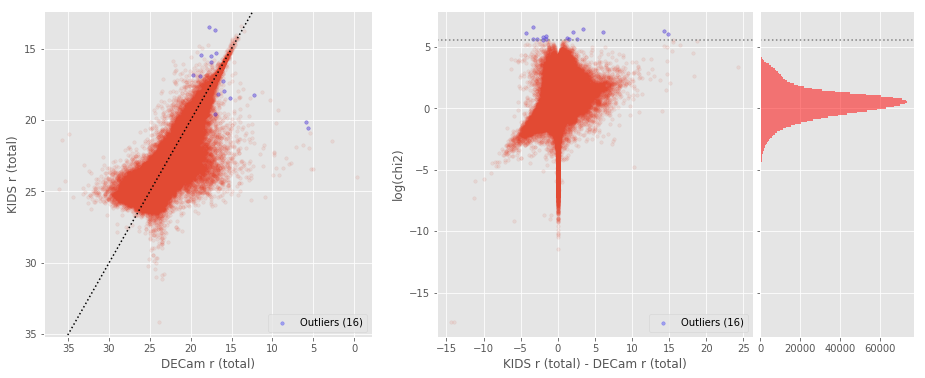

SUPRIME r (aperture) - DECam r (aperture) (541412 sources):
- Median: 0.13
- Median Absolute Deviation: 0.26
- 1% percentile: -2.7111525154113774
- 99% percentile: 1.588455638885501
Outliers separation: log(chi2) = 6.18
Number of outliers: 2



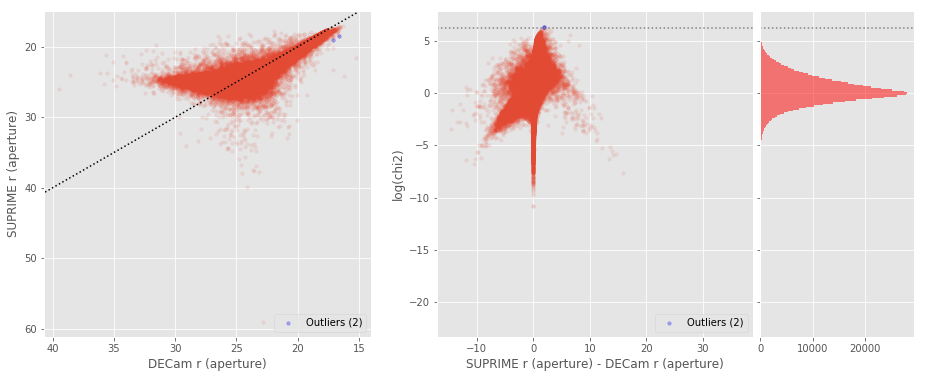

SUPRIME r (total) - DECam r (total) (557738 sources):
- Median: -0.01
- Median Absolute Deviation: 0.19
- 1% percentile: -2.1402436447143556
- 99% percentile: 1.6562145996093758
Outliers separation: log(chi2) = 4.84
Number of outliers: 335



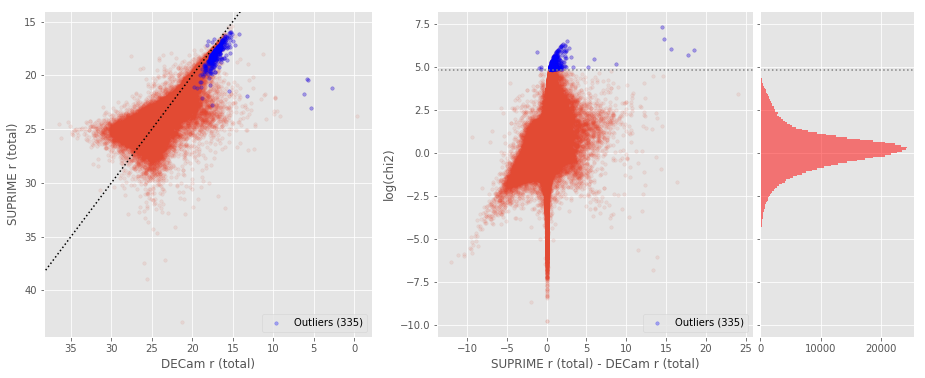

GPC1 r (aperture) - DECam r (aperture) (553335 sources):
- Median: 0.10
- Median Absolute Deviation: 0.16
- 1% percentile: -2.022557506561279
- 99% percentile: 1.742434997558596
Outliers separation: log(chi2) = 5.19
Number of outliers: 2893



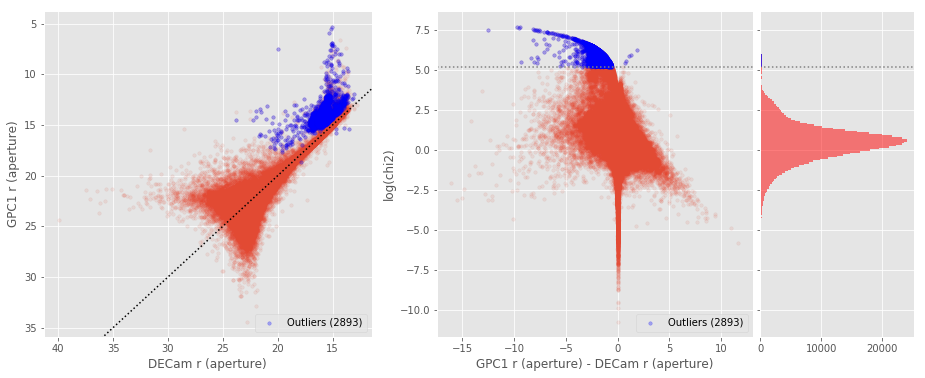

GPC1 r (total) - DECam r (total) (555874 sources):
- Median: 0.21
- Median Absolute Deviation: 0.14
- 1% percentile: -1.4518033599853515
- 99% percentile: 1.7165108680725139
Outliers separation: log(chi2) = 6.01
Number of outliers: 56



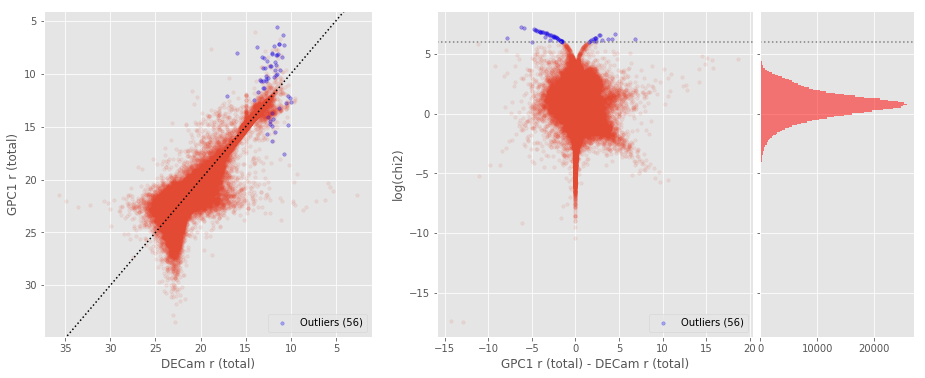

SUPRIME r (aperture) - KIDS r (aperture) (1847604 sources):
- Median: -0.06
- Median Absolute Deviation: 0.11
- 1% percentile: -0.8526589393615723
- 99% percentile: 0.8960712432861317
Outliers separation: log(chi2) = 4.41
Number of outliers: 243



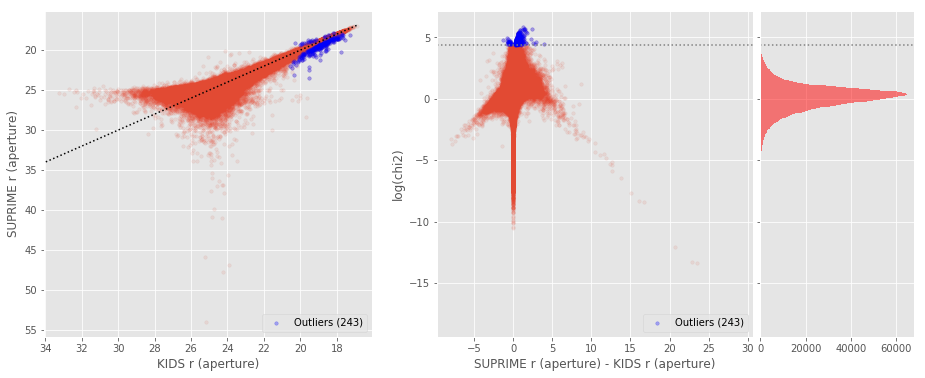

SUPRIME r (total) - KIDS r (total) (1808868 sources):
- Median: -0.19
- Median Absolute Deviation: 0.18
- 1% percentile: -1.4241688919067383
- 99% percentile: 1.1404189872741703
Outliers separation: log(chi2) = 4.46
Number of outliers: 1201



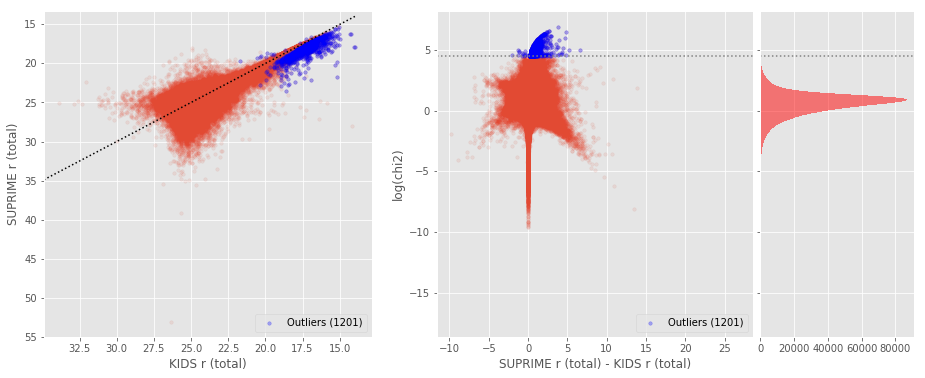

GPC1 r (aperture) - KIDS r (aperture) (1243447 sources):
- Median: -0.11
- Median Absolute Deviation: 0.21
- 1% percentile: -1.3515098571777342
- 99% percentile: 1.496448478698733
Outliers separation: log(chi2) = 5.88
Number of outliers: 8



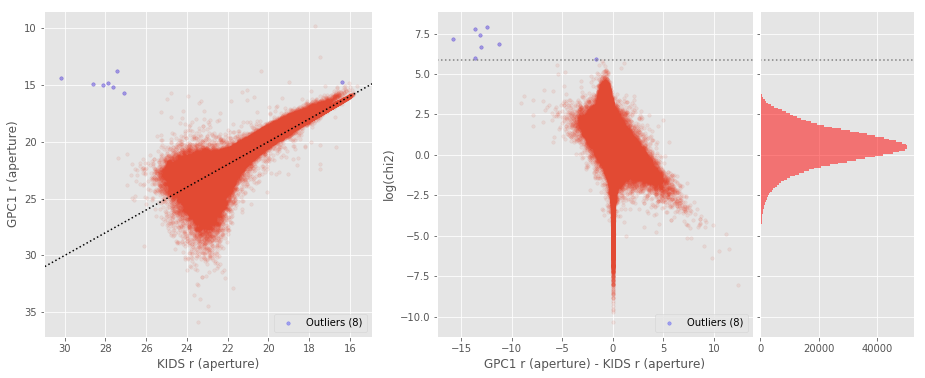

GPC1 r (total) - KIDS r (total) (1241285 sources):
- Median: 0.05
- Median Absolute Deviation: 0.13
- 1% percentile: -1.5403206634521482
- 99% percentile: 1.1657170867919837
Outliers separation: log(chi2) = 4.91
Number of outliers: 35



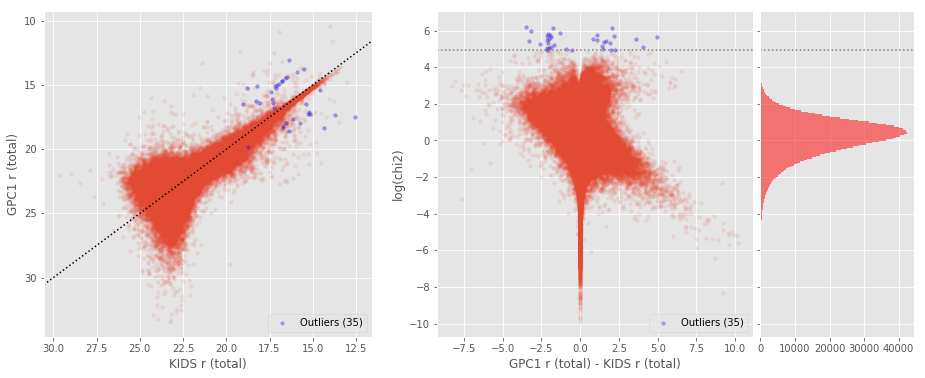

GPC1 r (aperture) - SUPRIME r (aperture) (349673 sources):
- Median: -0.10
- Median Absolute Deviation: 0.23
- 1% percentile: -1.5872383117675781
- 99% percentile: 1.525237350463859
Outliers separation: log(chi2) = 5.94
Number of outliers: 0



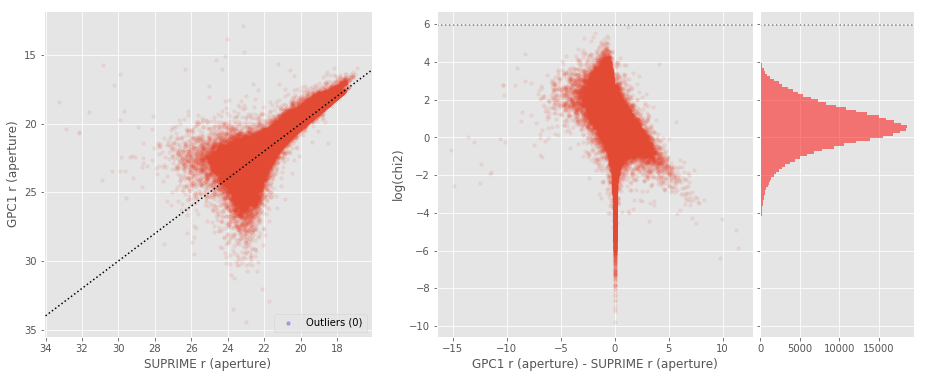

GPC1 r (total) - SUPRIME r (total) (348260 sources):
- Median: 0.11
- Median Absolute Deviation: 0.15
- 1% percentile: -1.6637367630004882
- 99% percentile: 1.2613206291198709
Outliers separation: log(chi2) = 4.98
Number of outliers: 18



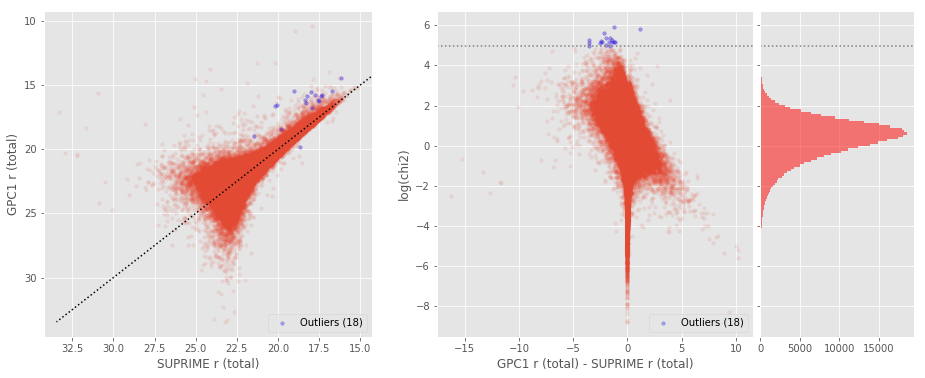

SUPRIME i (aperture) - KIDS i (aperture) (1635141 sources):
- Median: -0.07
- Median Absolute Deviation: 0.18
- 1% percentile: -2.0469532012939453
- 99% percentile: 1.169138336181641
Outliers separation: log(chi2) = 4.39
Number of outliers: 1754



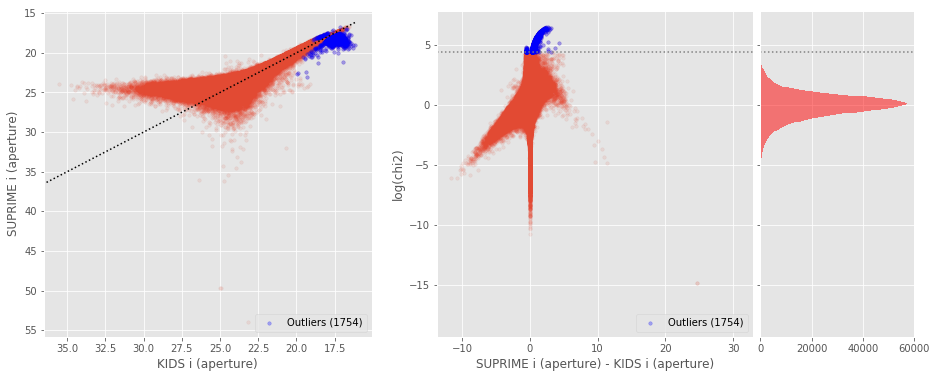

SUPRIME i (total) - KIDS i (total) (1625275 sources):
- Median: -0.27
- Median Absolute Deviation: 0.27
- 1% percentile: -3.0160333251953126
- 99% percentile: 1.2970731735229504
Outliers separation: log(chi2) = 4.37
Number of outliers: 1779



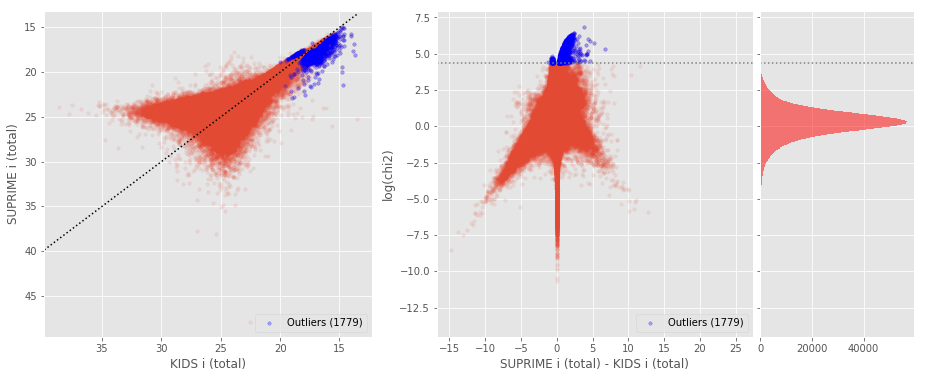

GPC1 i (aperture) - KIDS i (aperture) (1273601 sources):
- Median: -0.08
- Median Absolute Deviation: 0.16
- 1% percentile: -0.9477043151855469
- 99% percentile: 0.8186016082763672
Outliers separation: log(chi2) = 5.78
Number of outliers: 4



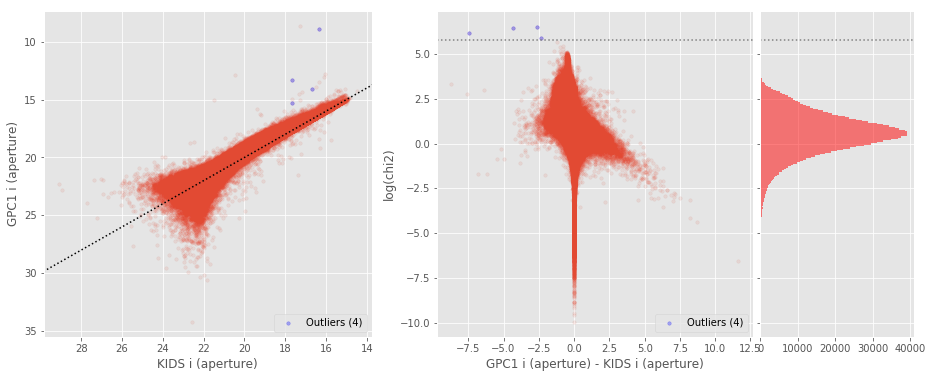

GPC1 i (total) - KIDS i (total) (1273835 sources):
- Median: 0.05
- Median Absolute Deviation: 0.10
- 1% percentile: -0.8343009567260742
- 99% percentile: 0.6969107818603506
Outliers separation: log(chi2) = 4.86
Number of outliers: 39



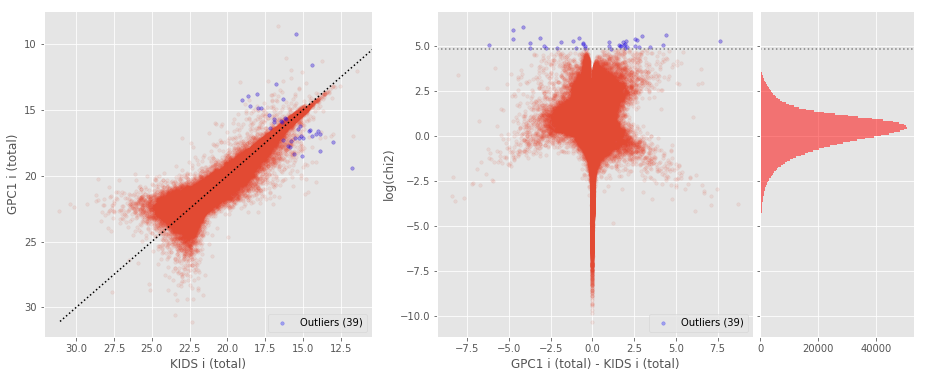

GPC1 i (aperture) - SUPRIME i (aperture) (353294 sources):
- Median: -0.03
- Median Absolute Deviation: 0.18
- 1% percentile: -1.1367273139953613
- 99% percentile: 0.9213391876220709
Outliers separation: log(chi2) = 6.03
Number of outliers: 4



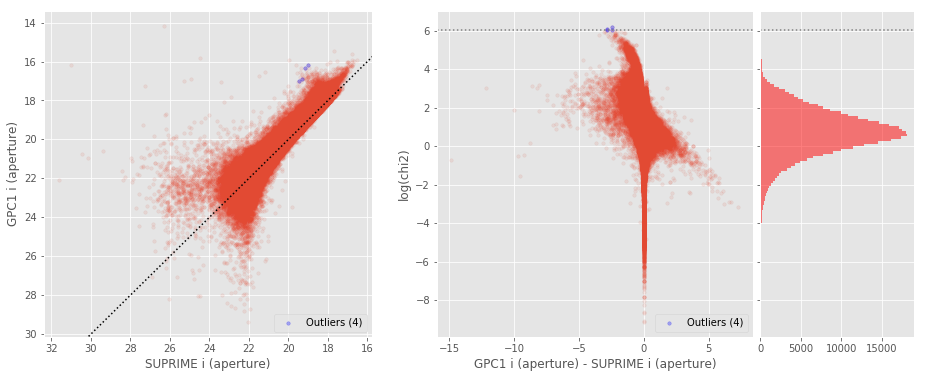

GPC1 i (total) - SUPRIME i (total) (352812 sources):
- Median: 0.20
- Median Absolute Deviation: 0.11
- 1% percentile: -0.8914554595947265
- 99% percentile: 0.7686335754394538
Outliers separation: log(chi2) = 4.83
Number of outliers: 188



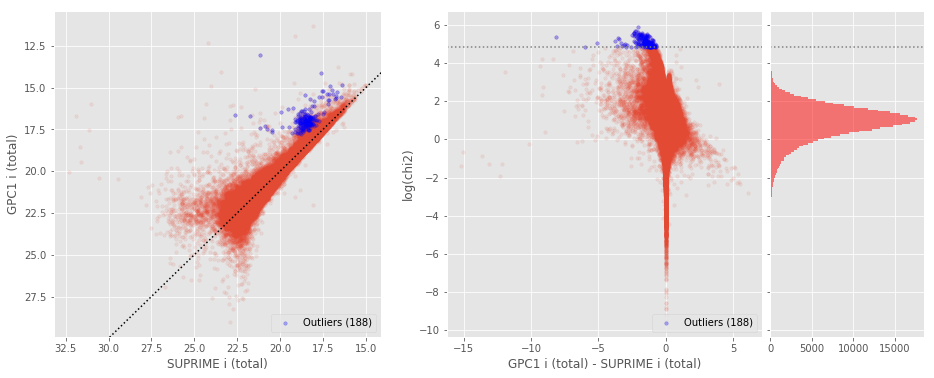

SUPRIME z (aperture) - DECam z (aperture) (1213210 sources):
- Median: 0.05
- Median Absolute Deviation: 0.22
- 1% percentile: -2.385577850341797
- 99% percentile: 1.2567932891845697
Outliers separation: log(chi2) = 5.81
Number of outliers: 60



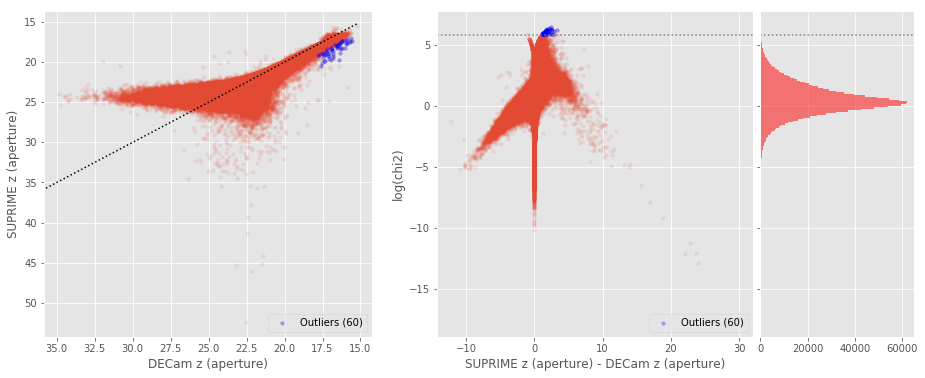

SUPRIME z (total) - DECam z (total) (1232167 sources):
- Median: 0.03
- Median Absolute Deviation: 0.13
- 1% percentile: -0.8611987304687501
- 99% percentile: 1.6053555679321367
Outliers separation: log(chi2) = 5.51
Number of outliers: 280



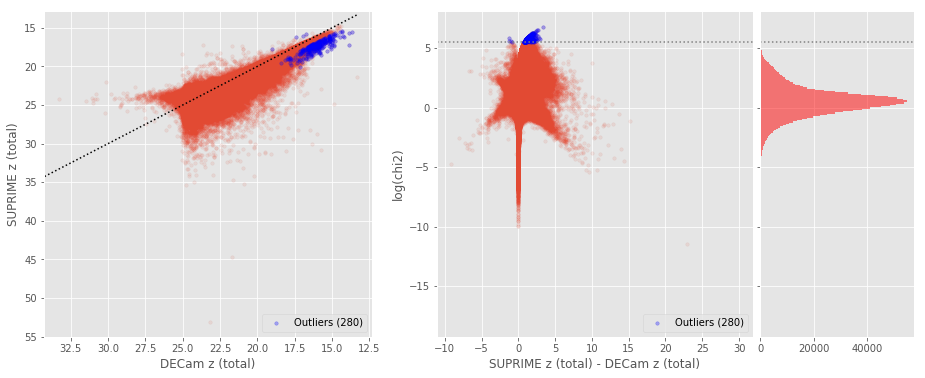

GPC1 z (aperture) - DECam z (aperture) (1277124 sources):
- Median: 0.09
- Median Absolute Deviation: 0.12
- 1% percentile: -1.6480256843566894
- 99% percentile: 1.2552158927917487
Outliers separation: log(chi2) = 5.00
Number of outliers: 14659



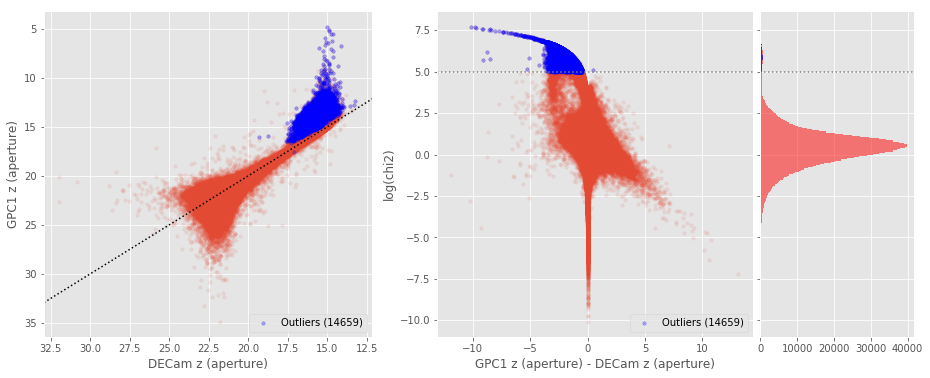

GPC1 z (total) - DECam z (total) (1277563 sources):
- Median: 0.26
- Median Absolute Deviation: 0.12
- 1% percentile: -0.7882545471191406
- 99% percentile: 1.373531684875486
Outliers separation: log(chi2) = 6.12
Number of outliers: 81



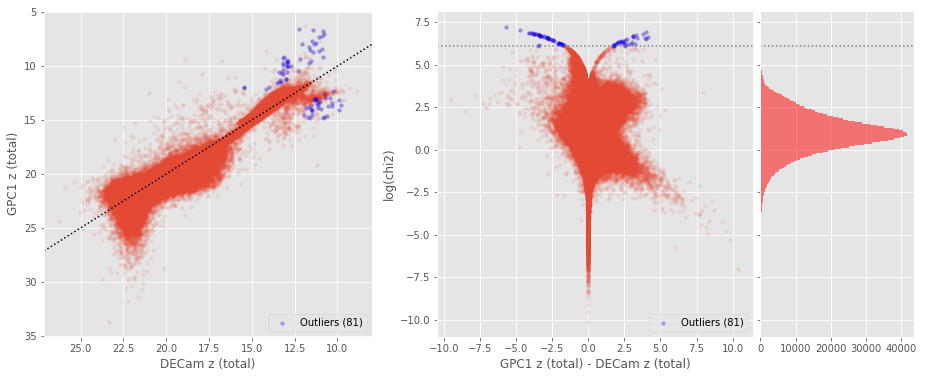

VIRCAM Z (aperture) - DECam z (aperture) (1730812 sources):
- Median: 0.16
- Median Absolute Deviation: 0.16
- 1% percentile: -1.2805481910705565
- 99% percentile: 0.8120602607727041
Outliers separation: log(chi2) = 5.84
Number of outliers: 10246



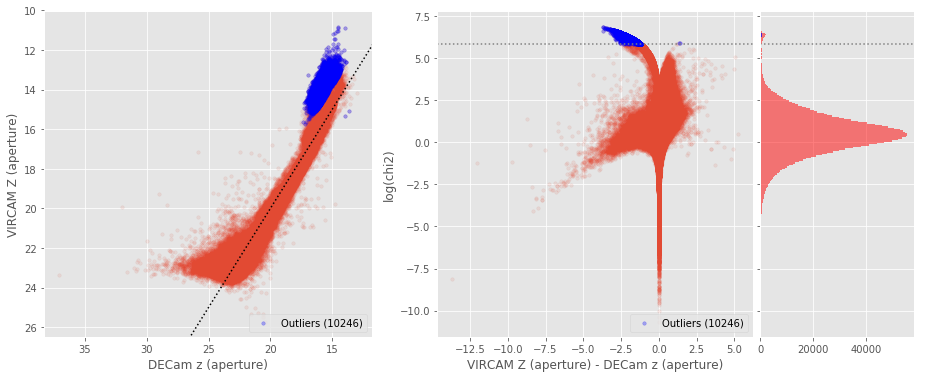

VIRCAM Z (total) - DECam z (total) (1732456 sources):
- Median: 0.14
- Median Absolute Deviation: 0.19
- 1% percentile: -0.9996345520019532
- 99% percentile: 1.5259140968322753
Outliers separation: log(chi2) = 4.55
Number of outliers: 7496



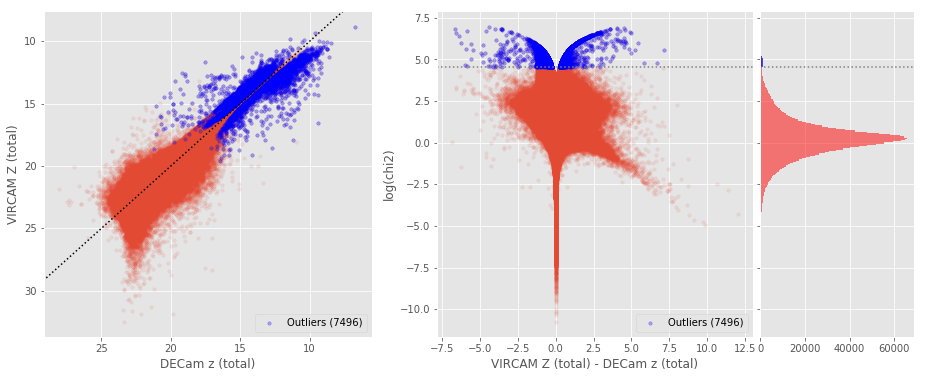

GPC1 z (aperture) - SUPRIME z (aperture) (351979 sources):
- Median: -0.04
- Median Absolute Deviation: 0.20
- 1% percentile: -1.1917795181274413
- 99% percentile: 1.2728551101684569
Outliers separation: log(chi2) = 5.83
Number of outliers: 1



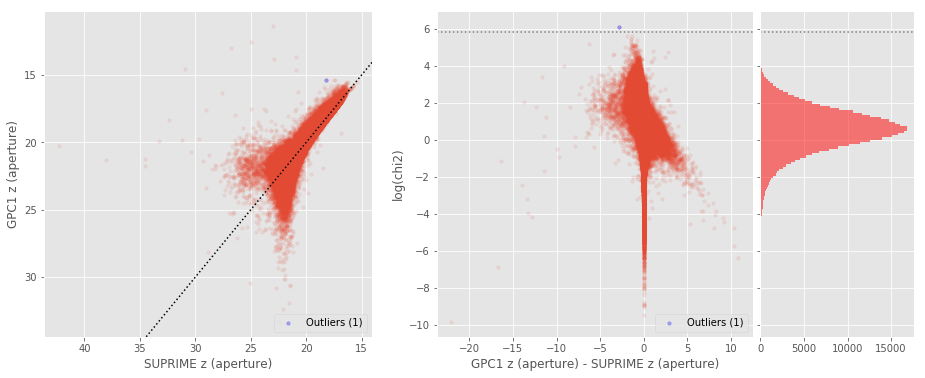

GPC1 z (total) - SUPRIME z (total) (351445 sources):
- Median: 0.18
- Median Absolute Deviation: 0.12
- 1% percentile: -1.0532553100585937
- 99% percentile: 0.9818671417236327
Outliers separation: log(chi2) = 5.07
Number of outliers: 15



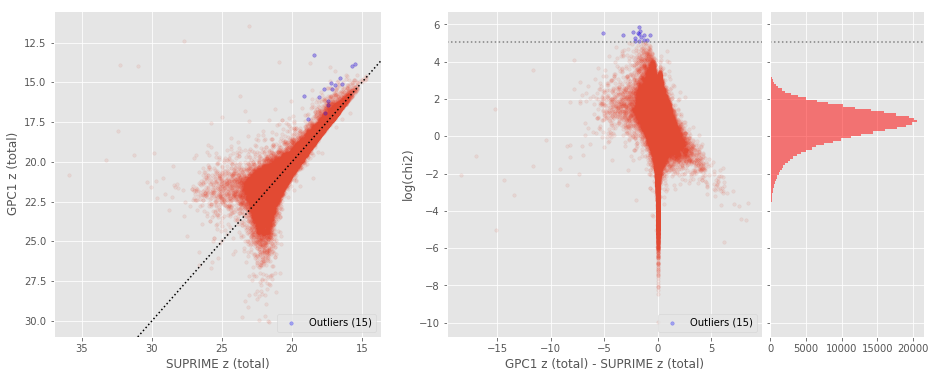

VIRCAM Z (aperture) - SUPRIME z (aperture) (553278 sources):
- Median: 0.04
- Median Absolute Deviation: 0.08
- 1% percentile: -2.1425264358520506
- 99% percentile: 0.4894385528564449
Outliers separation: log(chi2) = 4.22
Number of outliers: 181



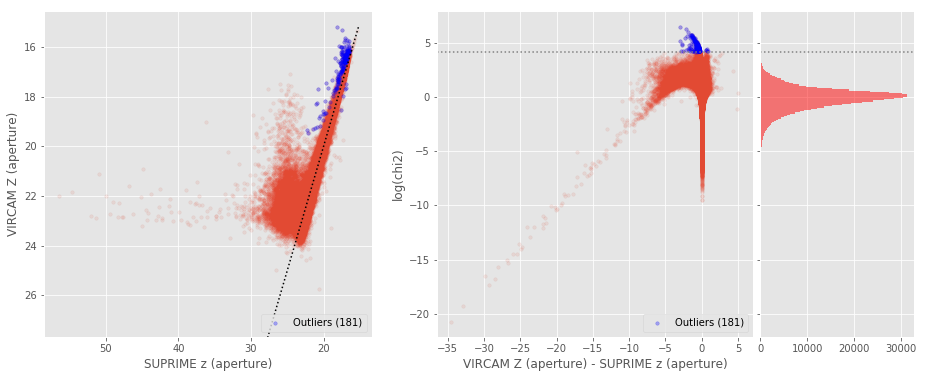

VIRCAM Z (total) - SUPRIME z (total) (549774 sources):
- Median: 0.07
- Median Absolute Deviation: 0.21
- 1% percentile: -2.1803362083435056
- 99% percentile: 1.3786007499694835
Outliers separation: log(chi2) = 4.03
Number of outliers: 598



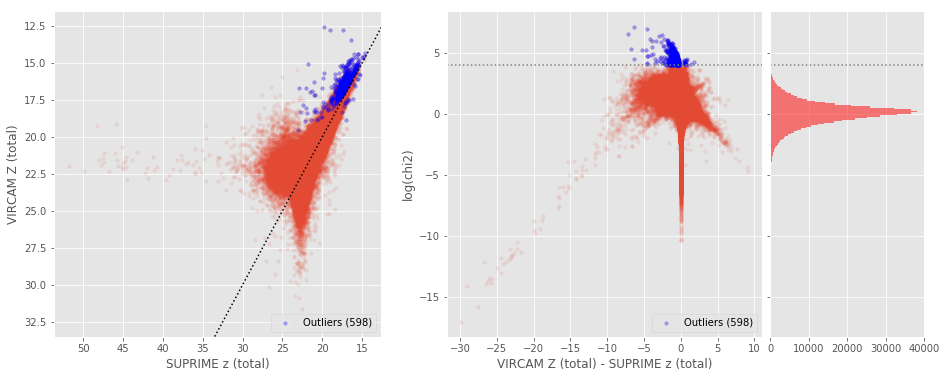

VIRCAM Z (aperture) - GPC1 z (aperture) (943612 sources):
- Median: 0.05
- Median Absolute Deviation: 0.18
- 1% percentile: -1.150290756225586
- 99% percentile: 1.010730648040773
Outliers separation: log(chi2) = 5.65
Number of outliers: 309



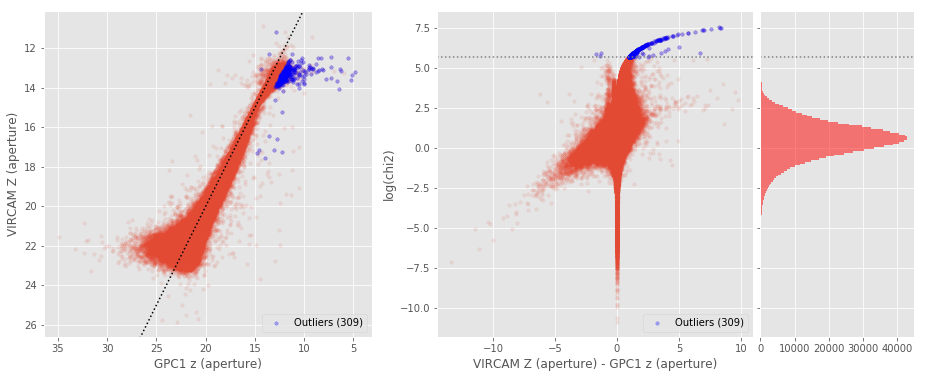

VIRCAM Z (total) - GPC1 z (total) (943958 sources):
- Median: -0.13
- Median Absolute Deviation: 0.15
- 1% percentile: -1.2738023948669435
- 99% percentile: 1.2375674057006814
Outliers separation: log(chi2) = 5.52
Number of outliers: 251



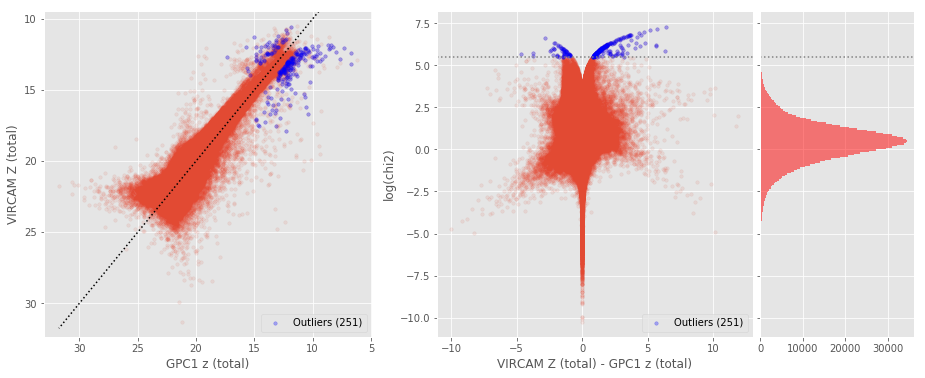

GPC1 y (aperture) - SUPRIME y (aperture) (347497 sources):
- Median: -0.19
- Median Absolute Deviation: 0.28
- 1% percentile: -1.8443033599853516
- 99% percentile: 1.679386215209945
Outliers separation: log(chi2) = 5.64
Number of outliers: 1



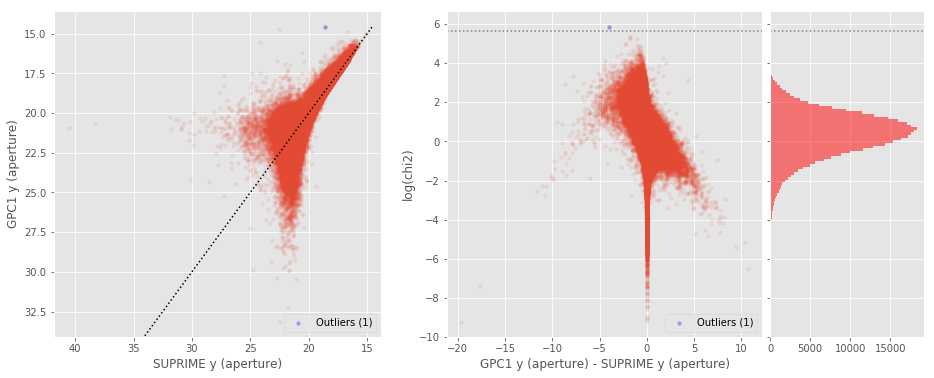

GPC1 y (total) - SUPRIME y (total) (342773 sources):
- Median: 0.09
- Median Absolute Deviation: 0.23
- 1% percentile: -2.0898357391357423
- 99% percentile: 1.6052894592285112
Outliers separation: log(chi2) = 5.17
Number of outliers: 2



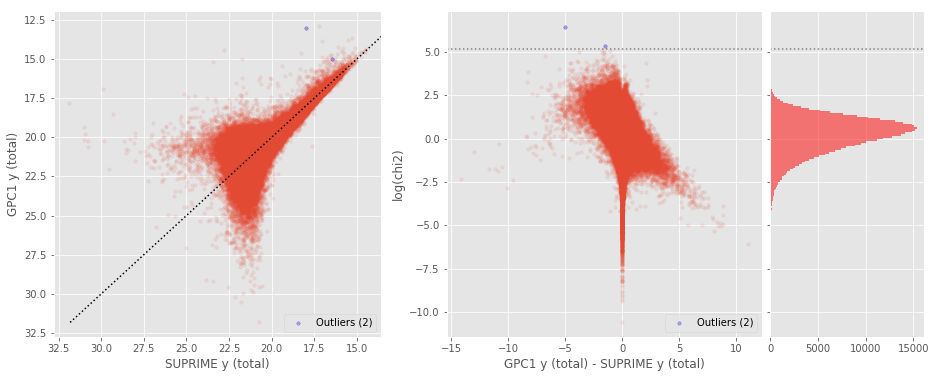

VIRCAM Y (aperture) - SUPRIME y (aperture) (364634 sources):
- Median: -0.07
- Median Absolute Deviation: 0.08
- 1% percentile: -2.113685894012451
- 99% percentile: 0.3652067375183089
Outliers separation: log(chi2) = 5.01
Number of outliers: 12



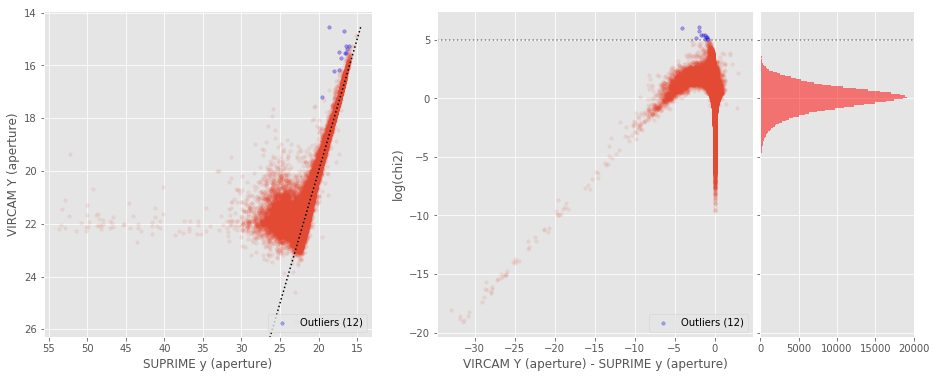

VIRCAM Y (total) - SUPRIME y (total) (362854 sources):
- Median: -0.06
- Median Absolute Deviation: 0.19
- 1% percentile: -2.0486551856994626
- 99% percentile: 1.1465886497497526
Outliers separation: log(chi2) = 4.57
Number of outliers: 96



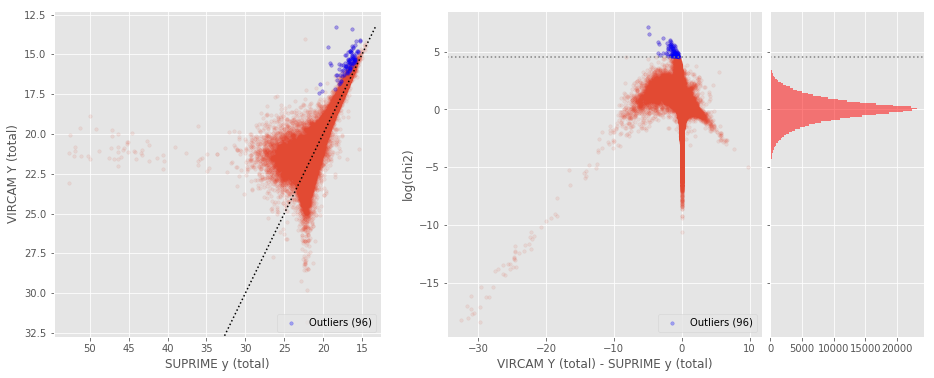

UKIDSS Y (aperture) - SUPRIME y (aperture) (136586 sources):
- Median: -0.01
- Median Absolute Deviation: 0.13
- 1% percentile: -5.489851093292236
- 99% percentile: 0.47726392745971674
Outliers separation: log(chi2) = 4.90
Number of outliers: 2



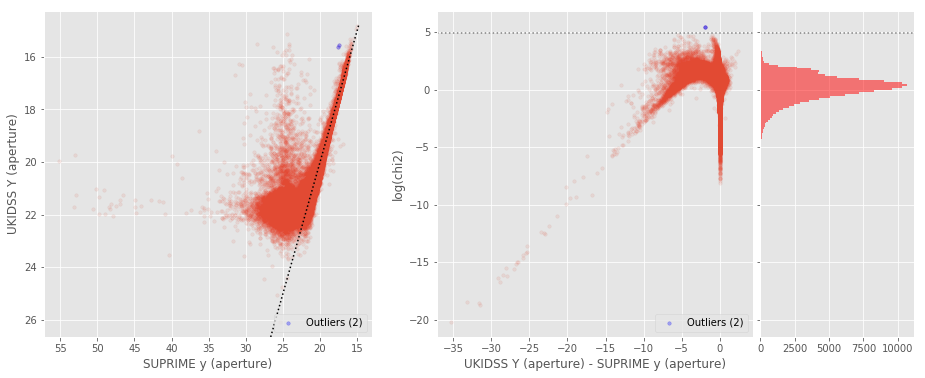

UKIDSS Y (total) - SUPRIME y (total) (133766 sources):
- Median: 0.02
- Median Absolute Deviation: 0.21
- 1% percentile: -5.147101020812988
- 99% percentile: 1.2031679153442392
Outliers separation: log(chi2) = 4.68
Number of outliers: 9



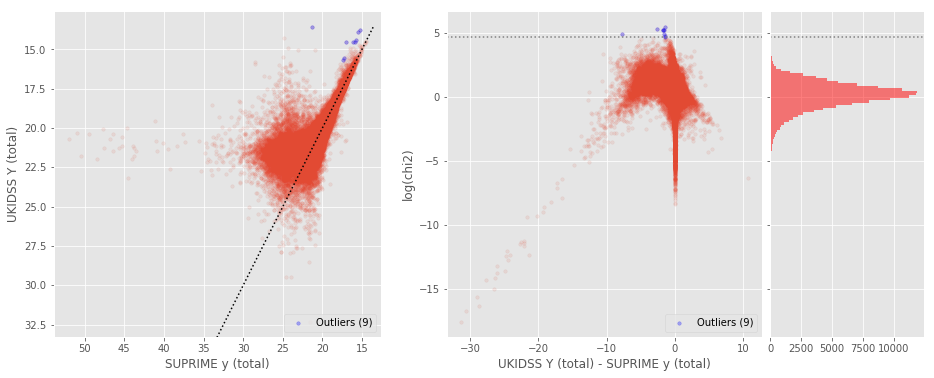

VIRCAM Y (aperture) - GPC1 y (aperture) (876389 sources):
- Median: 0.06
- Median Absolute Deviation: 0.22
- 1% percentile: -1.5836761474609373
- 99% percentile: 1.4140843963623047
Outliers separation: log(chi2) = 5.40
Number of outliers: 175



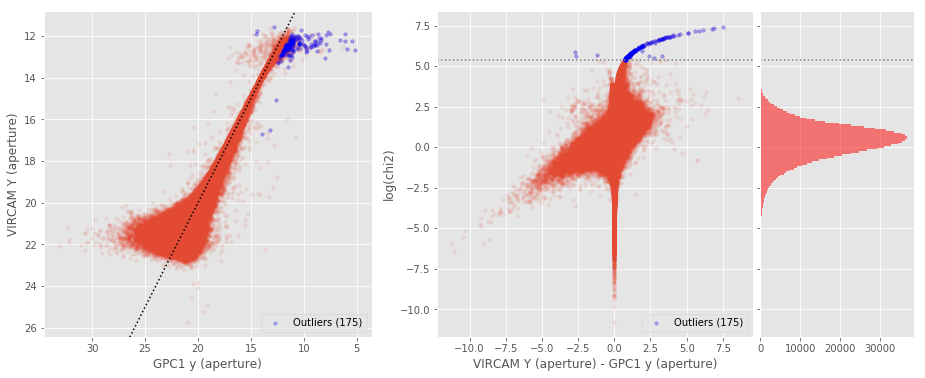

VIRCAM Y (total) - GPC1 y (total) (868369 sources):
- Median: -0.16
- Median Absolute Deviation: 0.22
- 1% percentile: -1.5550172424316406
- 99% percentile: 1.9008753967285095
Outliers separation: log(chi2) = 5.48
Number of outliers: 104



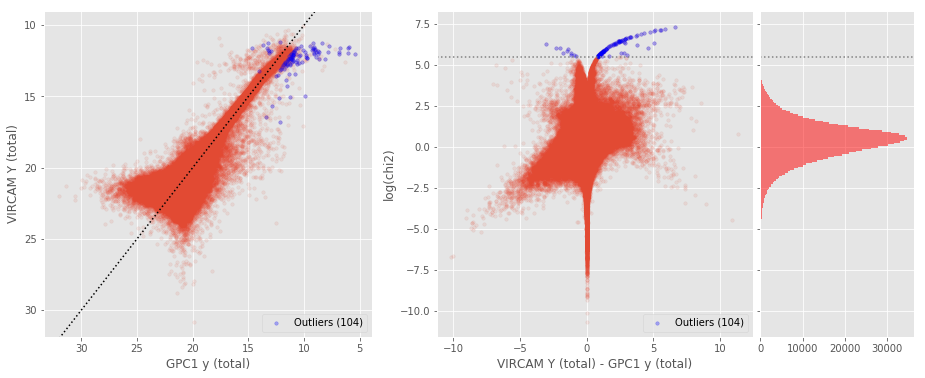

UKIDSS Y (aperture) - GPC1 y (aperture) (550657 sources):
- Median: 0.06
- Median Absolute Deviation: 0.17
- 1% percentile: -1.041597900390625
- 99% percentile: 1.0748867034912104
Outliers separation: log(chi2) = 5.08
Number of outliers: 160



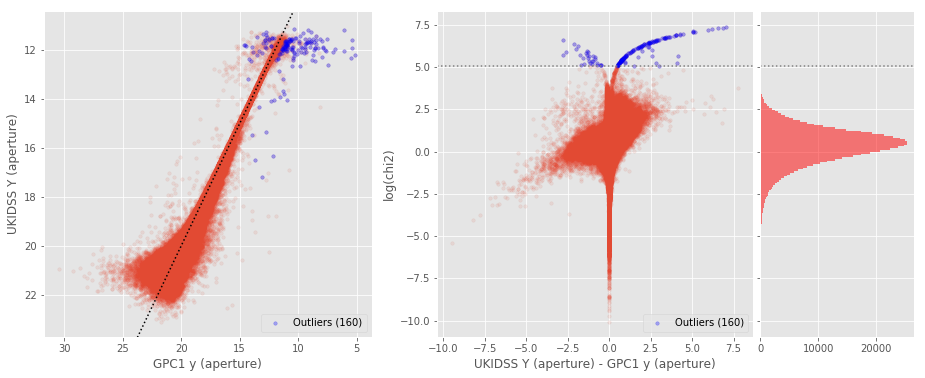

UKIDSS Y (total) - GPC1 y (total) (549336 sources):
- Median: -0.07
- Median Absolute Deviation: 0.14
- 1% percentile: -1.1074434280395509
- 99% percentile: 1.3896162986755385
Outliers separation: log(chi2) = 4.73
Number of outliers: 186



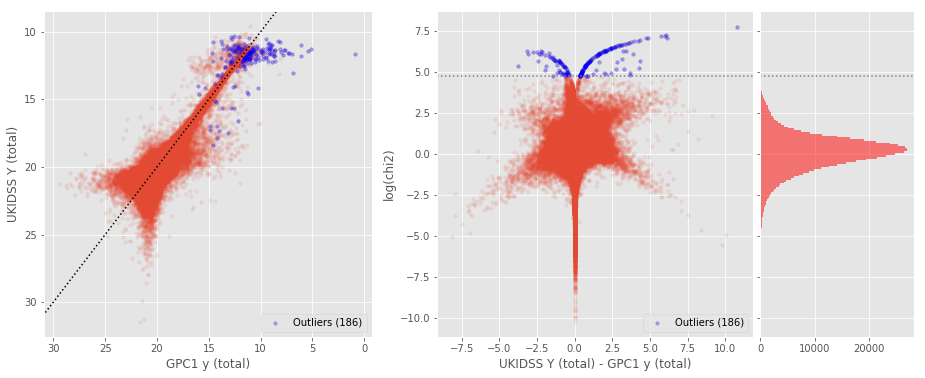

UKIDSS Y (aperture) - VIRCAM Y (aperture) (400503 sources):
- Median: 0.08
- Median Absolute Deviation: 0.07
- 1% percentile: -0.6378281021118164
- 99% percentile: 0.5510327148437497
Outliers separation: log(chi2) = 4.72
Number of outliers: 1327



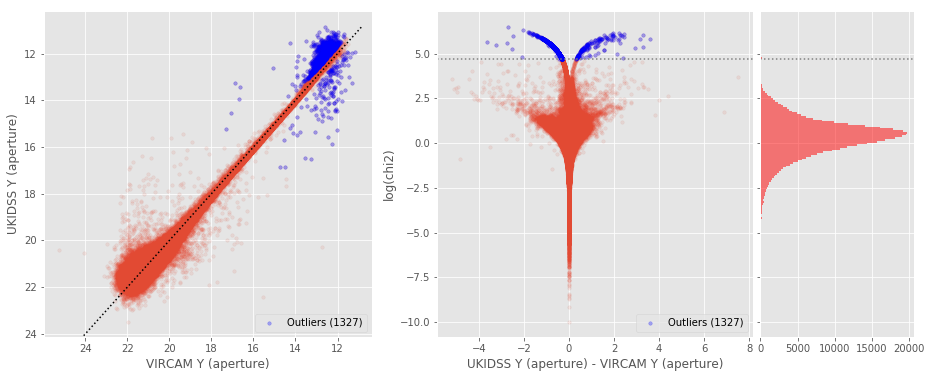

UKIDSS Y (total) - VIRCAM Y (total) (400113 sources):
- Median: 0.12
- Median Absolute Deviation: 0.15
- 1% percentile: -1.166804885864258
- 99% percentile: 1.2799399566650396
Outliers separation: log(chi2) = 5.02
Number of outliers: 796



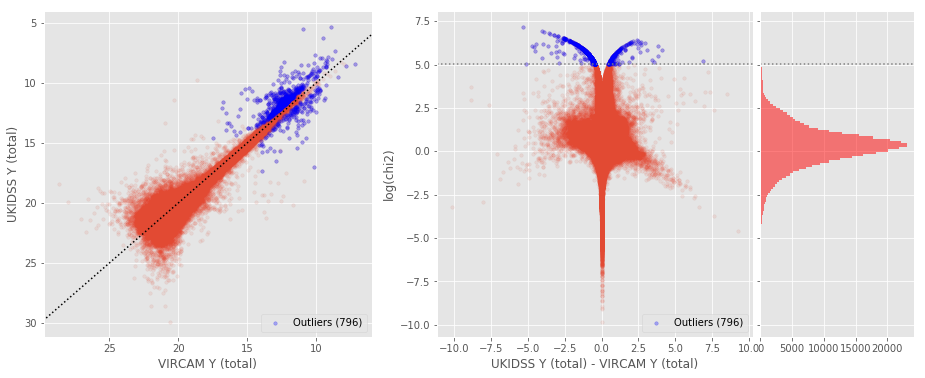

In [15]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        if basecol1 == "gpc1_z" and basecol2 == "vircam_z":
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        ecol1, ecol2 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2],
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)
        
        # Tot mag
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        ecol1, ecol2 = "merr_{}".format(basecol1), "merr_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2], 
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (total)".format(band1), "{} (total)".format(band2)))
        
plt.close() 
plt.close()
plt.close()

## 4/ Aperture correction issues

In [16]:
def apcor_check(x, y, stellarity, labels=["x", "y"], savefig=False):
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    #fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))   # 
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(stellarity)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    stellarity = np.copy(stellarity[mask])


    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    
    diff_label = "{} - {}".format(y_label, x_label)
    print("{}:".format(diff_label))
    
    # Subsample
    zoom = (x > 16) & (x < 20)


    # Comparing mag
    ax1.scatter(x, diff, marker='.', alpha=0.1, s=50)
    ax1.invert_xaxis()
    ax1.set_ylabel(diff_label)
    ax1.set_xlabel(x_label)
    

    # Zoom Plot
    y_min, y_max = np.percentile(diff[zoom], [1., 99.])
    y_delta = .1 * (y_max - y_min)
    y_min -= y_delta
    y_max += y_delta

    if len(x[zoom]) < 1000:
        alpha = 0.4
    else:
        alpha = 0.1
    print(len(x[zoom]))
    pl = ax2.scatter(x[zoom], diff[zoom], marker='.', alpha=alpha, s=50, c=stellarity[zoom], cmap="jet")
    ax2.invert_xaxis()
    ax2.set_ylabel(diff_label)
    ax2.set_xlabel(x_label)
    ax2.set_ylim([y_min, y_max])
    fig.colorbar(pl, label="stellarity (1=star)")
    
    #ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(diff[zoom], ax=ax3, bins='knuth', facecolor='black', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_apcorrIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

KIDS g (aperture) - DECam g (aperture):
42755


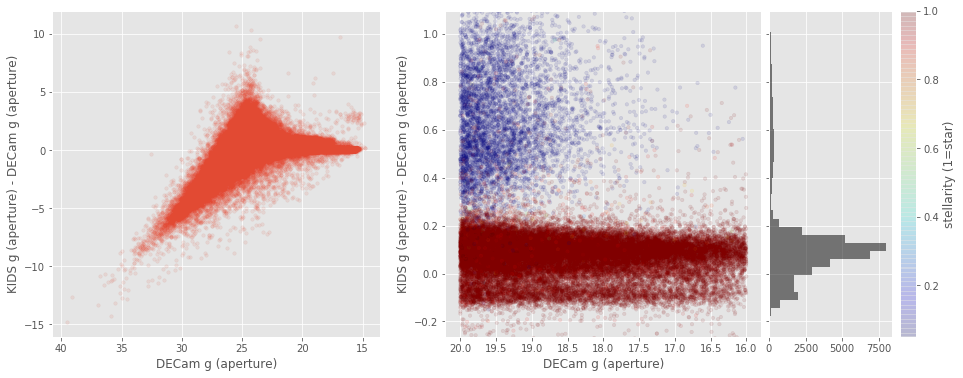

SUPRIME g (aperture) - DECam g (aperture):
7898


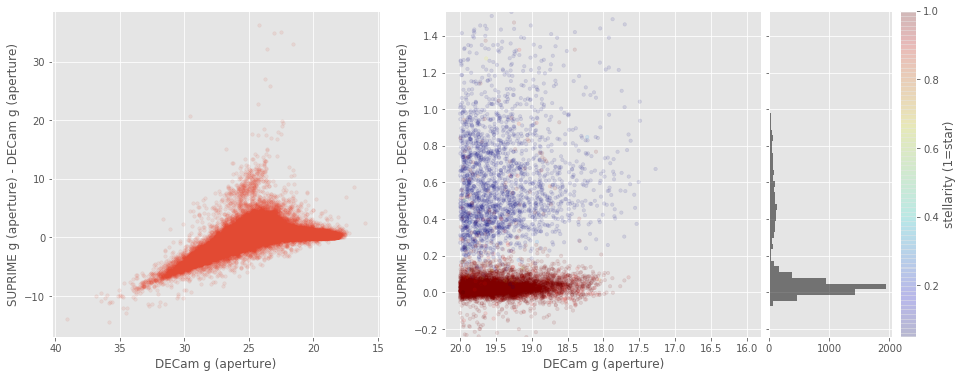

GPC1 g (aperture) - DECam g (aperture):
43996


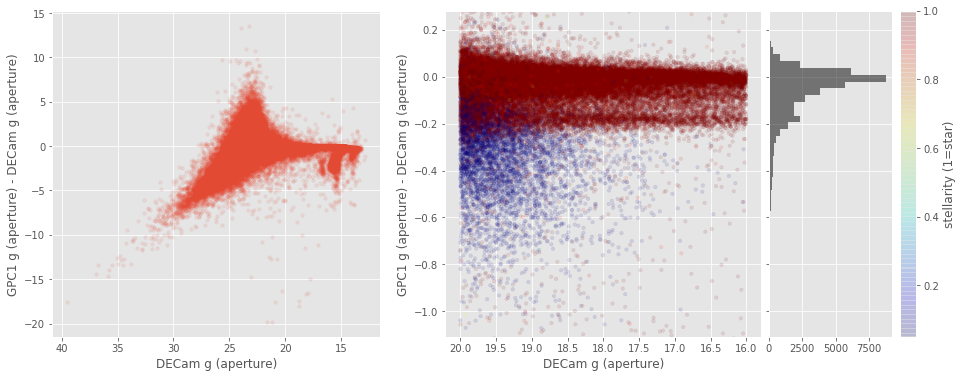

SUPRIME g (aperture) - KIDS g (aperture):
13944


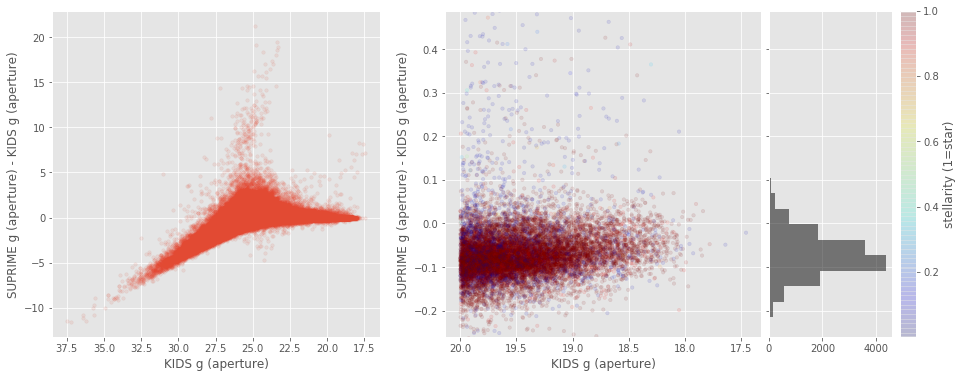

GPC1 g (aperture) - KIDS g (aperture):
116427


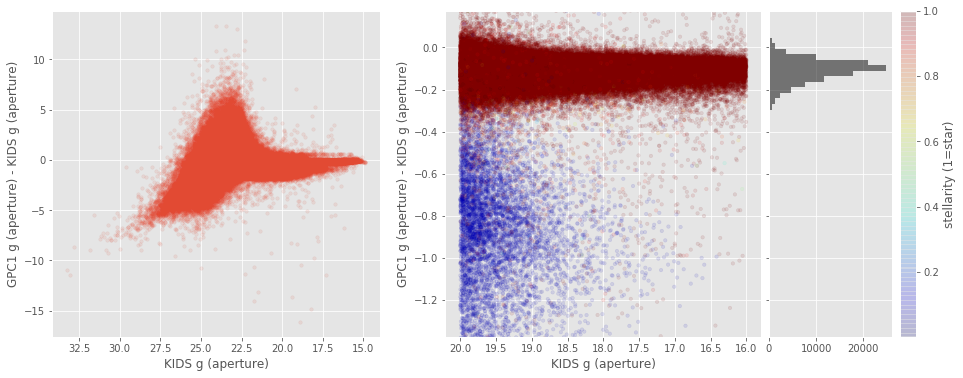

GPC1 g (aperture) - SUPRIME g (aperture):
15283


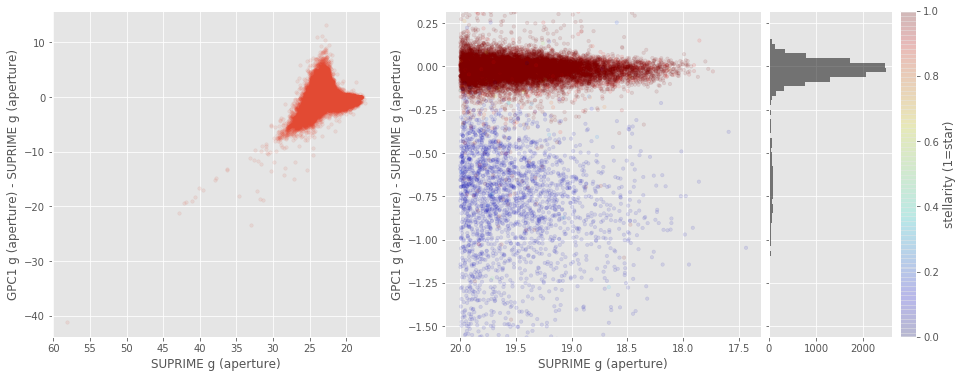

KIDS r (aperture) - DECam r (aperture):
86473


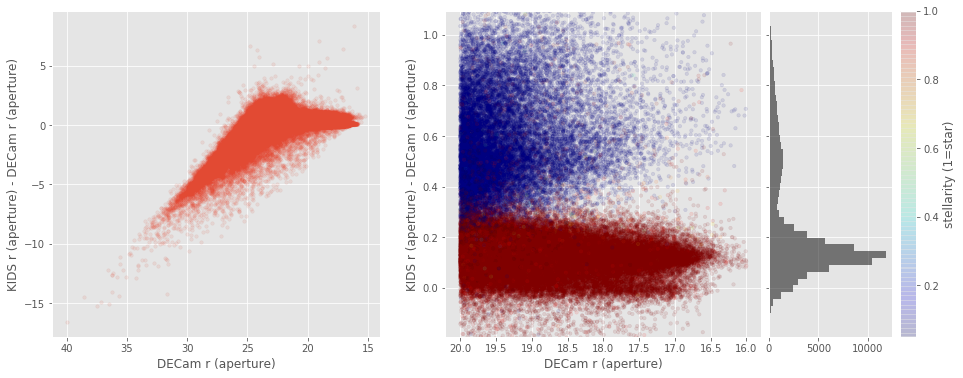

SUPRIME r (aperture) - DECam r (aperture):
20067


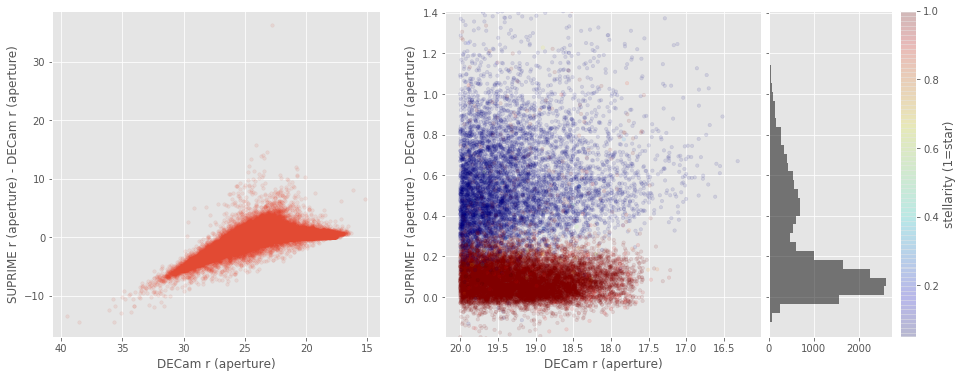

GPC1 r (aperture) - DECam r (aperture):
97736


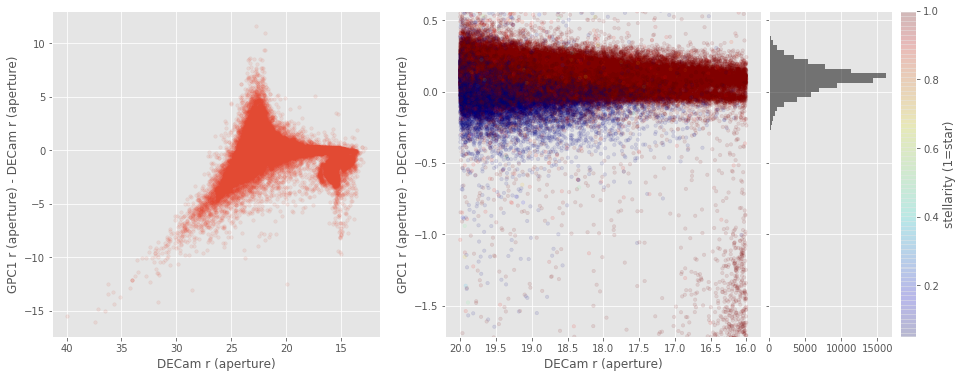

SUPRIME r (aperture) - KIDS r (aperture):
35879


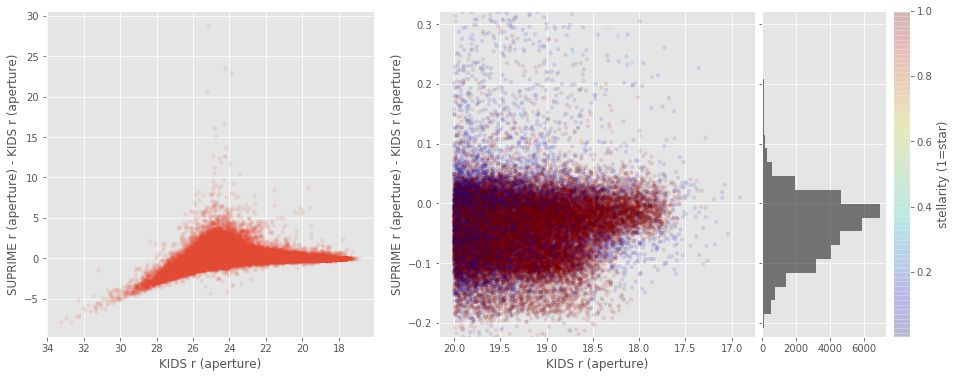

GPC1 r (aperture) - KIDS r (aperture):
165873


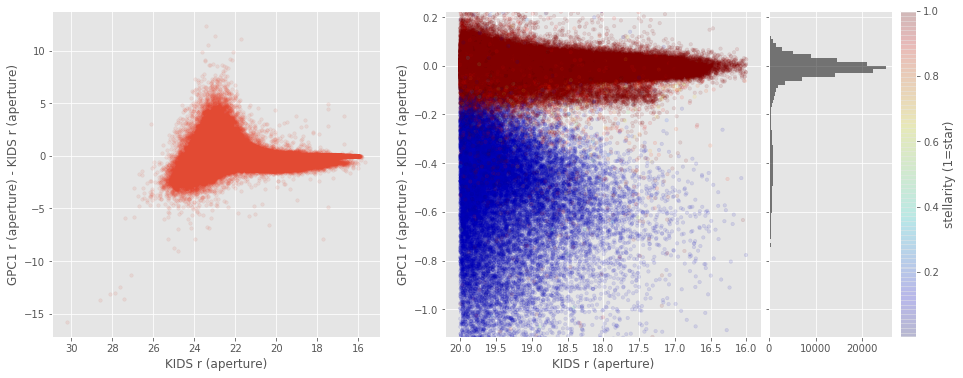

GPC1 r (aperture) - SUPRIME r (aperture):
37109


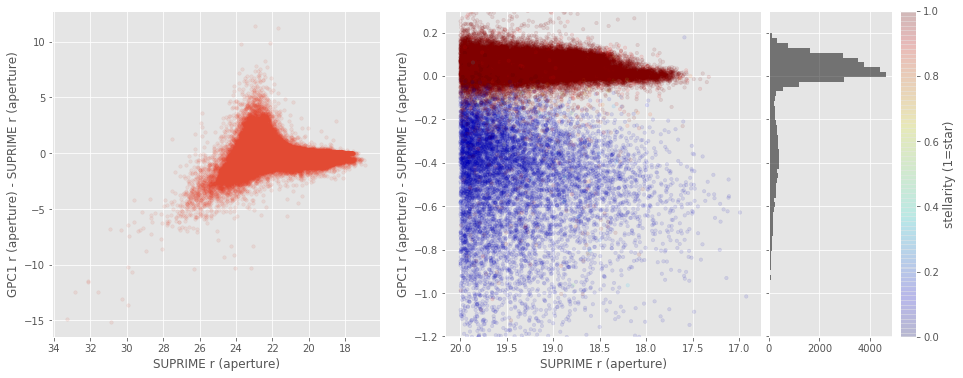

SUPRIME i (aperture) - KIDS i (aperture):
60264


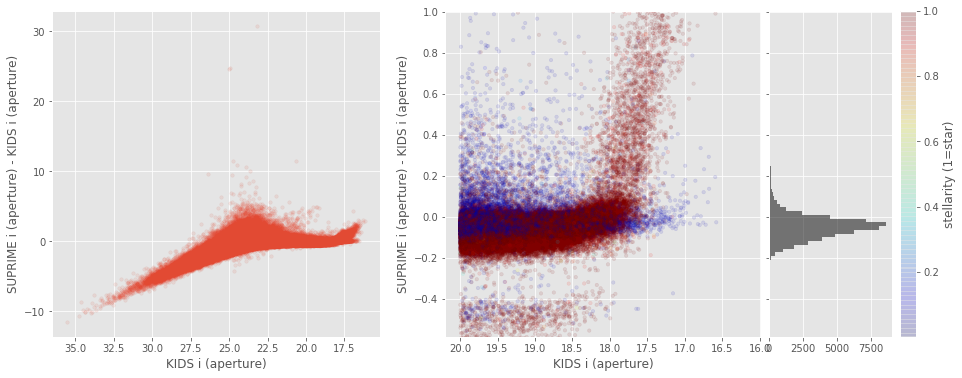

GPC1 i (aperture) - KIDS i (aperture):
262943


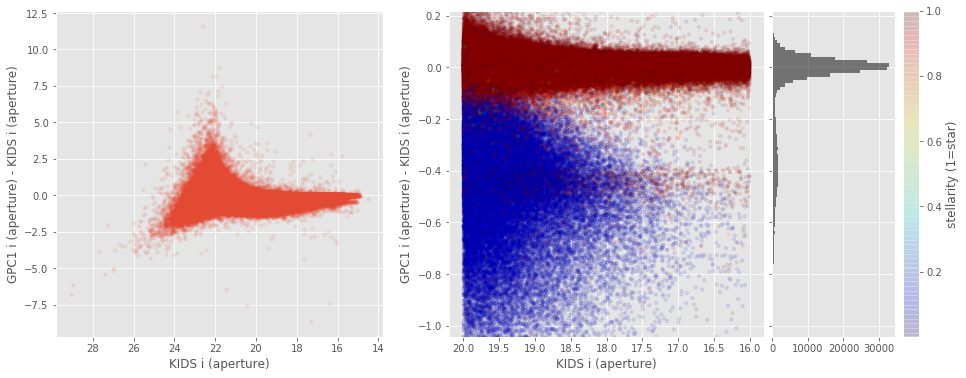

GPC1 i (aperture) - SUPRIME i (aperture):
63761


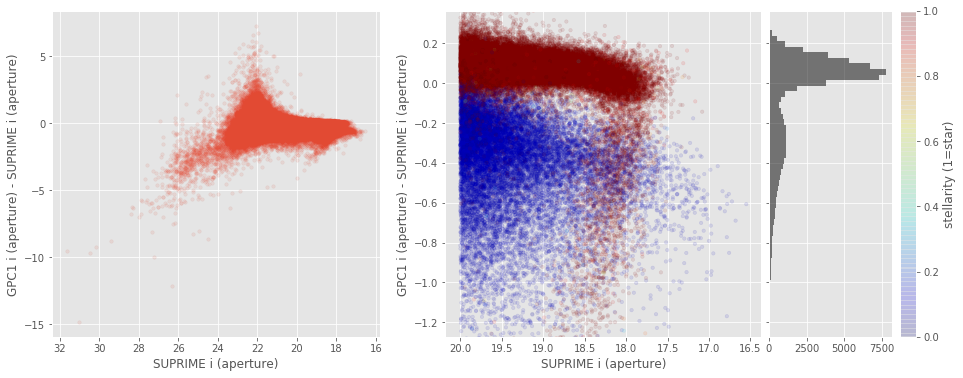

SUPRIME z (aperture) - DECam z (aperture):
100549


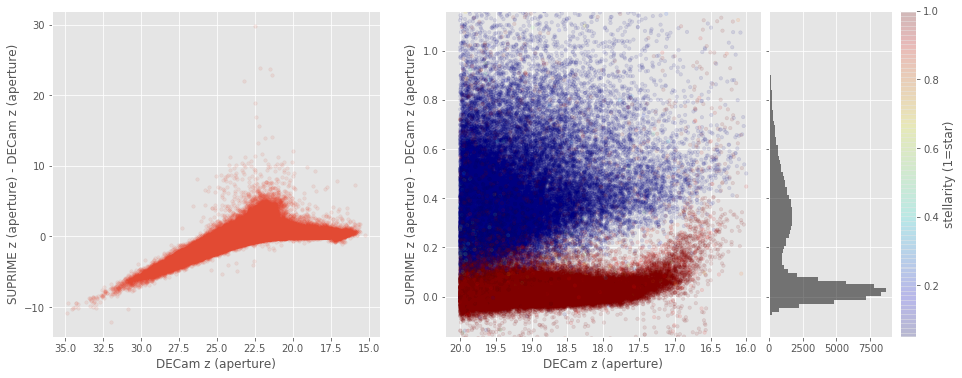

GPC1 z (aperture) - DECam z (aperture):
409600


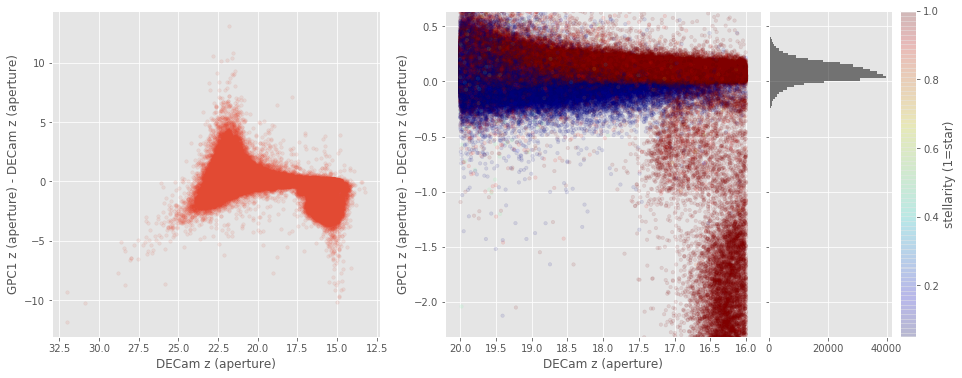

VIRCAM Z (aperture) - DECam z (aperture):
291847


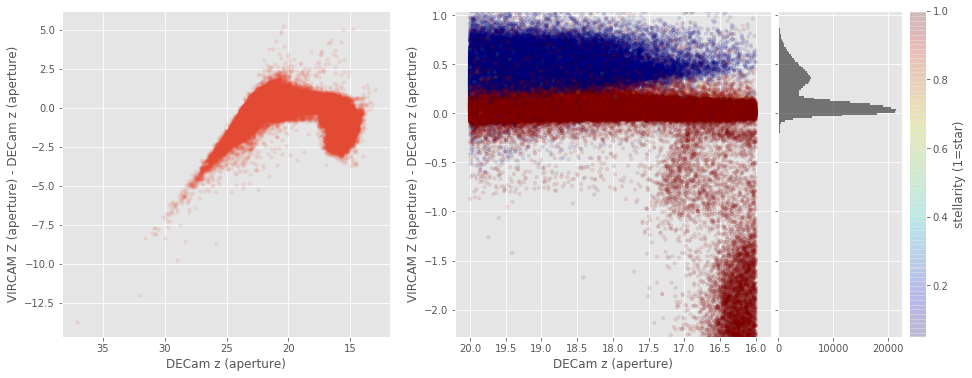

GPC1 z (aperture) - SUPRIME z (aperture):
84895


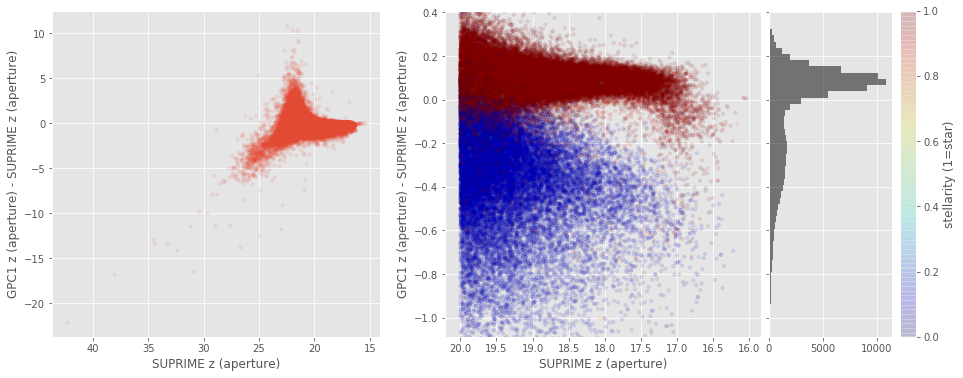

VIRCAM Z (aperture) - SUPRIME z (aperture):
58838


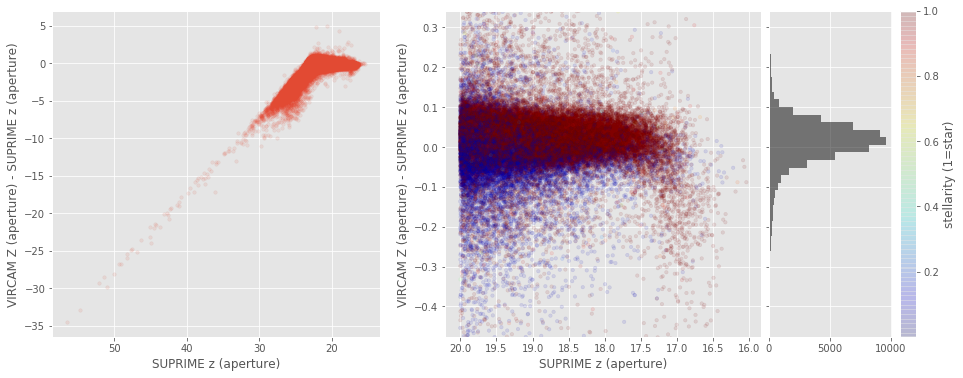

VIRCAM Z (aperture) - GPC1 z (aperture):
277352


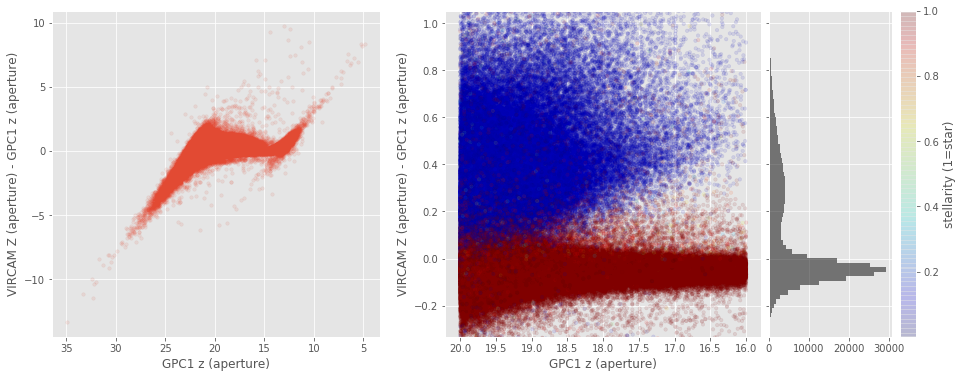

GPC1 y (aperture) - SUPRIME y (aperture):
95823


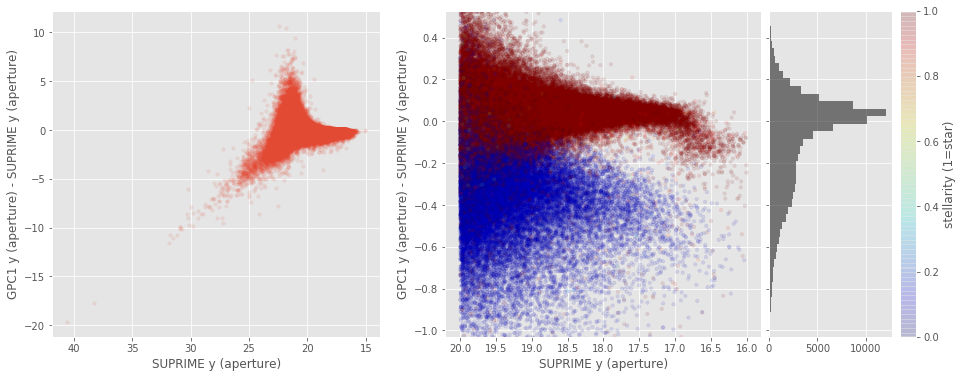

VIRCAM Y (aperture) - SUPRIME y (aperture):
61257


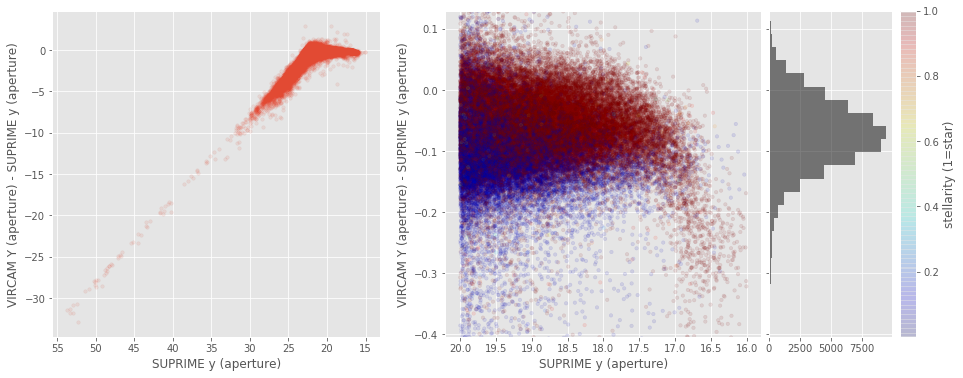

UKIDSS Y (aperture) - SUPRIME y (aperture):
54244


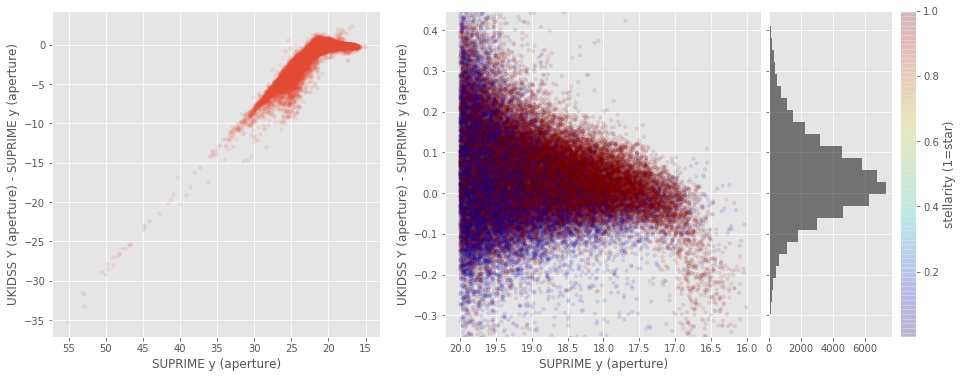

VIRCAM Y (aperture) - GPC1 y (aperture):
319077


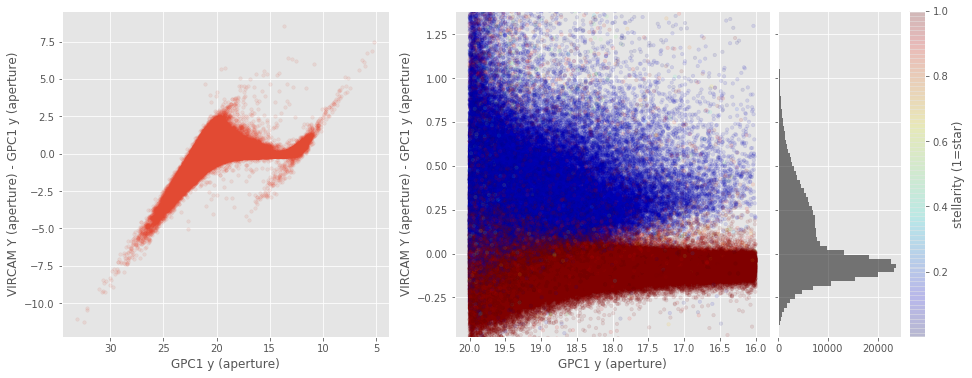

UKIDSS Y (aperture) - GPC1 y (aperture):
320294


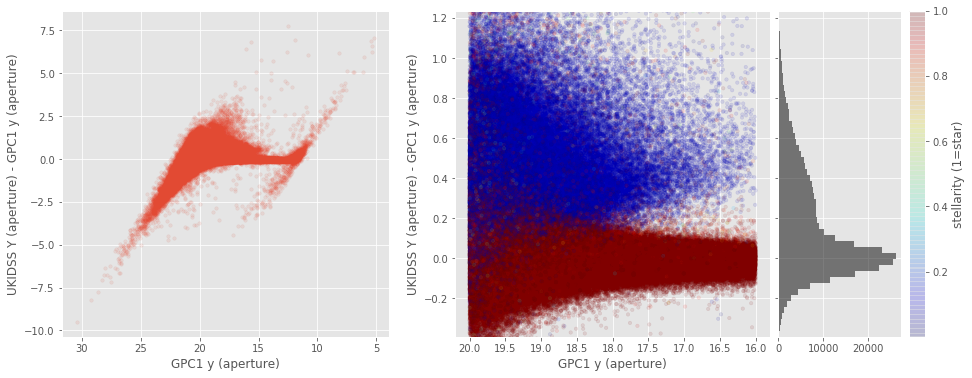

UKIDSS Y (aperture) - VIRCAM Y (aperture):
211009


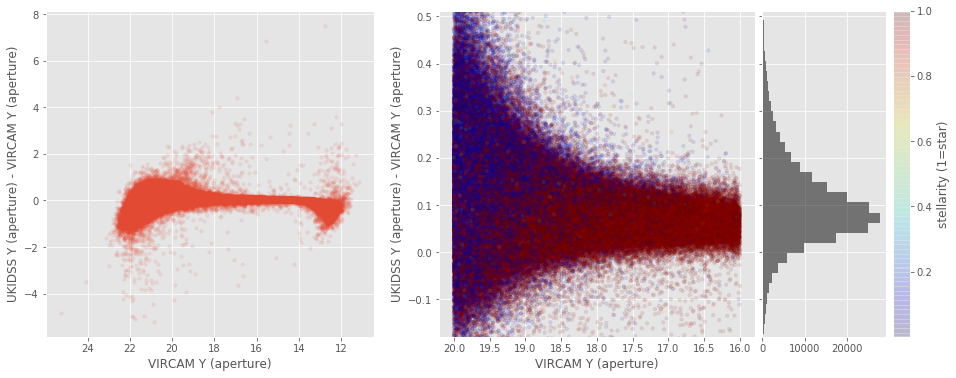

In [17]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
       
        if (basecol1 == "gpc1_r" and basecol2 == "kids_r"):
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)

        apcor_check(master_catalogue[col1], master_catalogue[col2], master_catalogue['stellarity'],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)
